# Exercise 1)

## a)

The errors in Stan code are the followings:

* A ";" is missing in the model block, in line y ~ normal(mu, sigma) 
* In generated quantities, we should predict just for the xpred year. So we need to compute the mean of the observation model for that year. Thus in this block we have:

```
  real mu_pred  = alpha + beta * xpred ;
  real ypred    = normal_rng(mu_pred, sigma);
```

* Last error is in the definition of the parameter sigma, which should take values in the positive reals and not the negative reals. So in the parameter block we should have: `real<lower=0> sigma;`

In [1]:
library(aaltobda)
library(cmdstanr)
library(matrixStats)
data("drowning")

This is cmdstanr version 0.5.3

- CmdStanR documentation and vignettes: mc-stan.org/cmdstanr

- CmdStan path: /home/jmaronasm/.cmdstan/cmdstan-2.30.1

- CmdStan version: 2.30.1


A newer version of CmdStan is available. See ?install_cmdstan() to install it.
To disable this check set option or environment variable CMDSTANR_NO_VER_CHECK=TRUE.



In [2]:
cmdstan_path()
cmdstan_version()

[1] "/home/jmaronasm/.cmdstan/cmdstan-2.30.1"

[1] "2.30.1"

In [3]:
## Set path to model
file   <- file.path("stan_files", "drowning", "drowning.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas Molano *
//  This file implements the correction of Stan code from assignment 7 exercise 1.

data {
  
  int<lower=0> N; // number of data points
  vector[N] x;    // observation year
  vector[N] y;    // observation number of drowned
  real xpred;     // prediction year

  real sigma_beta;  // std for the prior of beta
  real mu_alpha  ;  // mean for the prior of alpha
  real sigma_alpha; // std for the prior of alpha

}

parameters {
  
  real alpha;
  real beta;
  real<lower=0> sigma;
  
}

transformed parameters {
  
  vector[N] mu = alpha + beta*x;
  
}

model {

  beta  ~ normal( 0, sigma_beta  );
  alpha ~ normal( mu_alpha, sigma_alpha );

  y ~ normal(mu, sigma);

}

generated quantities {

  real mu_pred  = alpha + beta * xpred ;
  real ypred    = normal_rng(mu_pred, sigma);

}


## b) and c) and d)

The value of $\sigma_b = 23$. This is obtained as follows. Since $\text{Pr}(-69 < \text{beta} < 69) = 0.99$ and since the prior is Gaussian, we know this interval is given at three times the standard deviation. So if we solve $ 69 = 3\cdot \sigma_b$, we obtain the desired $23$. The variance is thus given by $529$, so we add the following line in the model block Stan code. 

```
beta ~ normal( 0, 23 );
```

since normal uses the mean and the scale as its parameterization.

However, rather than hard code them in the code in this way, I will allow the user to specify this parameter through the data block, so that I can run multiple checks compiling Stan's code just once.

Note. I don't fully agree with this part of the exercise. If the number of drownings do not change more than $50\%$ this means that $\text{beta}$ at most should lie between $2$ and $-2$. This implies setting a prior with a standard deviation of $\frac{2}{3}$. If then we know that the historical mean of drwonings is $138$ this information should be encoded in $\text{alpha}$  by setting an informative prior around $138$. (It could be the case, of course, that I've missunderstood things).

So the prior for alpha will be a Gaussian centered at $138$ and with a standard deviation of $10$. Which means the offset can lie between $138 \pm 30$. I think this is rather non-informative but enough informative.  

Also based on this, the $X$ value cannot be directly a year and it is change by an ordinal number, i.e. if we have $10$ years then $x$ takes values in the set $\{x \in \mathbb{N} \mid 1 \leq x < 11\}$

In [4]:
## add a column to the dataframe with an ordinal sequence
drowning$range = c(1:length(drowning$year))

In [5]:
drowning

year,drownings,range
<int>,<int>,<int>
1980,149,1
1981,127,2
1982,139,3
1983,141,4
1984,122,5
1985,120,6
1986,140,7
1987,124,8
1988,200,9


In [6]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    x           = drowning$range        , 
                    y           = drowning$drownings    ,
                    N           = length(drowning$range),
                    xpred       = 41                    , # is the one corresponding to 2020
                    # Prior hyperparameters
                    mu_alpha    = 138                        ,
                    sigma_alpha = 10                         ,
                    sigma_beta  = 2/3
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500 # print update every 500 iters
                   )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Ite

In [7]:
## sumary (Rhat looks good)
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-148.5952715,-148.26950,1.2622750,1.0326309,-151.059100,-147.2340000,1.002435,1455.862,2210.705
alpha,147.3254073,147.39900,6.3760765,6.3003087,136.801900,157.6369500,1.001666,1789.536,2121.217
beta,-0.7096436,-0.70918,0.2813413,0.2799653,-1.154637,-0.2473349,1.000960,1812.495,2064.144
sigma,26.5870278,26.29965,3.2215213,3.0896643,21.760815,32.2277000,1.001773,2263.703,2589.937
mu[1],146.6157590,146.66900,6.1564179,6.0882969,136.441450,156.5997000,1.001922,1810.928,2194.756
mu[2],145.9061148,145.95800,5.9419663,5.8866633,135.993650,155.6043000,1.001702,1833.902,2197.626
mu[3],145.1964647,145.23550,5.7332963,5.6323974,135.682100,154.5975000,1.001882,1861.742,2272.379
mu[4],144.4868288,144.53350,5.5310636,5.3833206,135.291650,153.5602500,1.001536,1893.670,2216.118
mu[5],143.7771845,143.80500,5.3360012,5.1668610,134.883800,152.5407500,1.001153,1933.696,2202.946


In [8]:
## extract draws
draws <- fit$draws(format = 'df')

In [9]:
beta_post  <- draws$beta
alpha_post <- draws$alpha
sigma_post <- draws$sigma

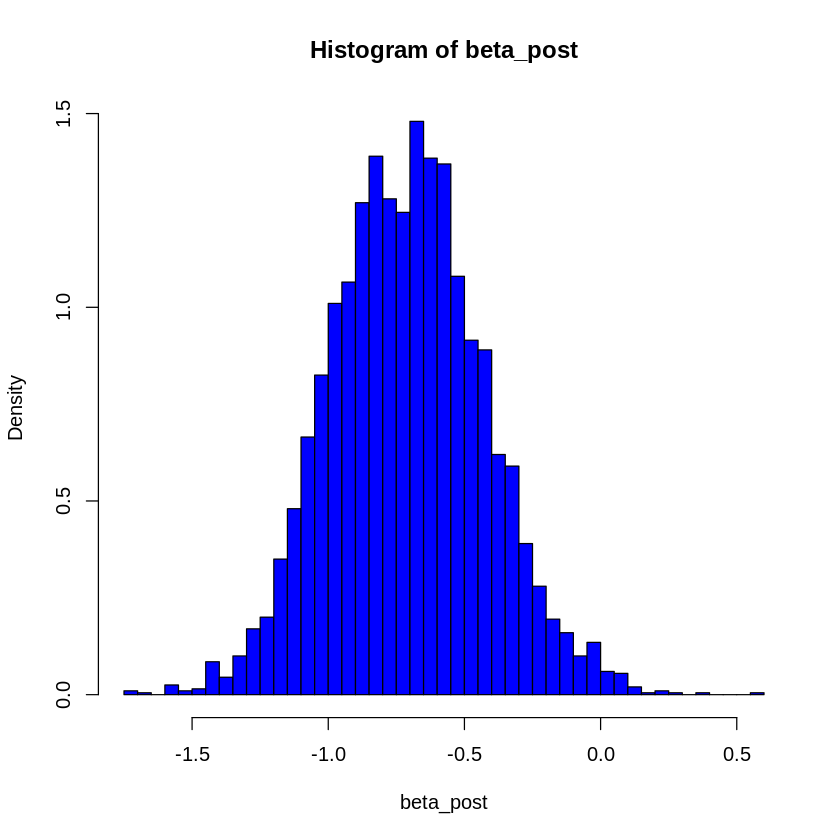

In [10]:
hist( beta_post, freq = FALSE, col = 'blue', breaks = 40)

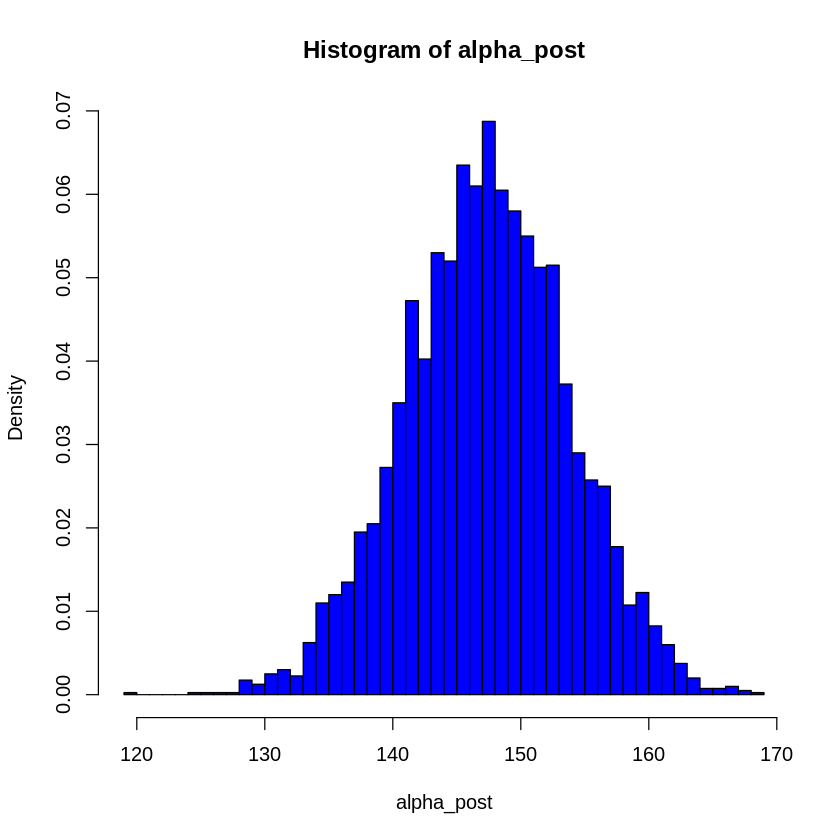

In [11]:
hist( alpha_post, freq = FALSE, col = 'blue', breaks = 40)

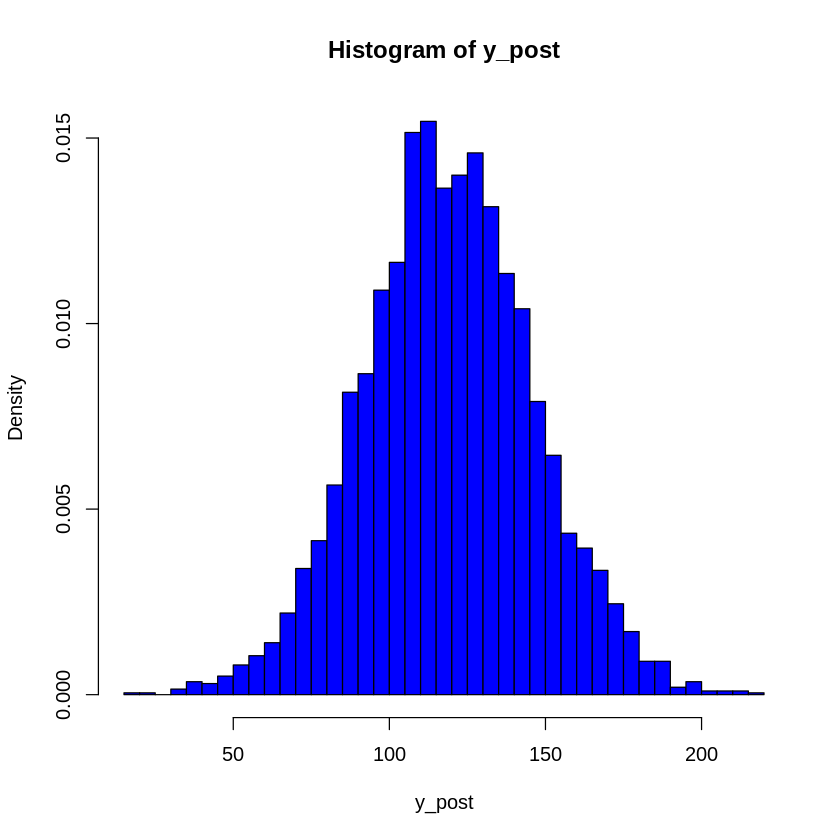

In [12]:
## Posterior predictive histogram for year 2019 (the last year)
mu_post_2019 <- beta_post * 40 + alpha_post
y_post       <- rnorm(length(mu_post_2019)) # sample from standard normal
y_post       <- sigma_post * y_post + mu_post_2019

hist(y_post, freq = FALSE, col = 'blue', breaks = 40)

In [16]:
mu_post  <- outer(beta_post, drowning$range, FUN = "*") + alpha_post
qs       <- colQuantiles(mu_post , probs = c(0.05,0.95,0.50))
mu_med   <- qs[,"50%"]
mu_q5    <- qs[,"5%"]
mu_q95   <- qs[,"95%"]

ERROR: Error in xy.coords(x, y): object 'mu_med' not found


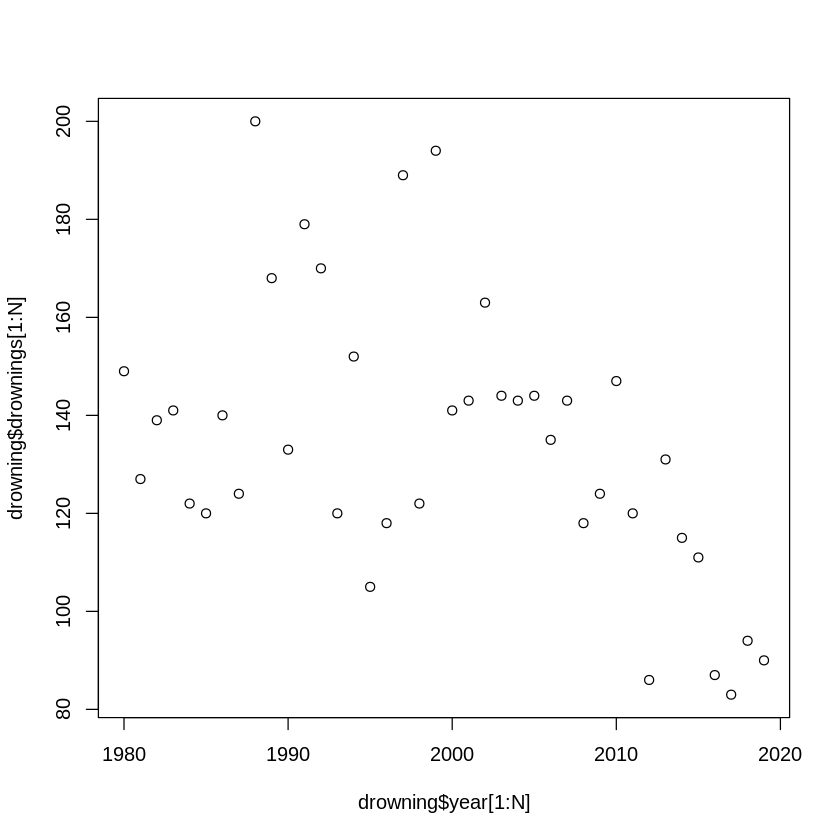

In [14]:
N <- 40

plot( drowning$year[1:N] , drowning$drownings[1:N])
lines(drowning$year[1:N], mu_med[1:N] , type = 'l', col = 'blue')
lines(drowning$year[1:N], mu_q5[1:N]  , type = 'l', col = 'blue', lty=2, lwd=3)
lines(drowning$year[1:N], mu_q95[1:N] , type = 'l', col = 'blue', lty=2, lwd=3)

## Important remark

As you can see the posterior draws of $\text{beta}$ matches those from Aki in the exercise. If I set a prior as he want us to do with `normal(0,23)` the curious thing is that unless we set a prior for $\text{alpha}$ which is centered around $138$ things does not work. 

If we use this prior, the results are similar to mine which means that the prior for $\text{beta}$ is too wide, since, as I mentioned, and based on the exercise the slope should be at most $2$ (not $69$) and is the offset what shifts everything up to $138$. 

# Exercise 2)

In [15]:
#install.packages("invgamma")
#install.packages("gridExtra")
library(invgamma)
library(bayesplot)
library(gridExtra)

This is bayesplot version 1.9.0

- Online documentation and vignettes at mc-stan.org/bayesplot

- bayesplot theme set to bayesplot::theme_default()

   * Does _not_ affect other ggplot2 plots

   * See ?bayesplot_theme_set for details on theme setting



In [16]:
data("factory")

In [17]:
factory

V1,V2,V3,V4,V5,V6
<int>,<int>,<int>,<int>,<int>,<int>
83,117,101,105,79,57
92,109,93,119,97,92
92,114,92,116,103,104
46,104,86,102,79,77
67,87,67,116,92,100


## Bullshit model

Analyzing the code provided in the second listing. Why is it bullshit?

The generative model is given by:

$$
\begin{array}{c}
&y_{ij}   \sim \mathcal{N}(\mu_j,\sigma_j)\\
&\mu_j    \sim \mathcal{N}(0,1)\\
&\sigma_j \sim \text{Inv-}\chi^2(10)
\end{array}
$$


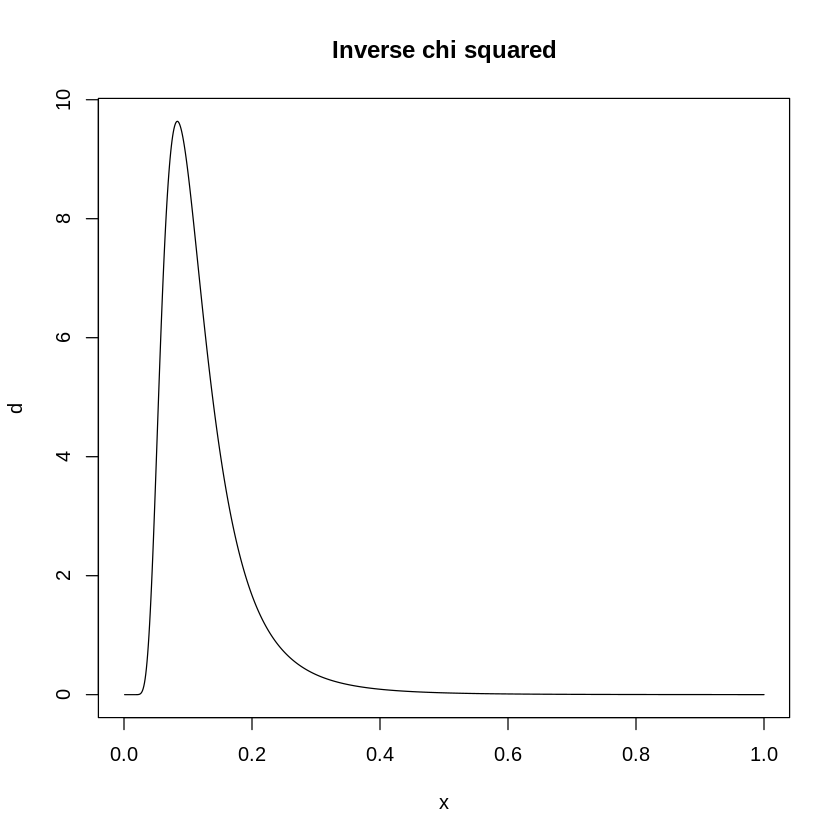

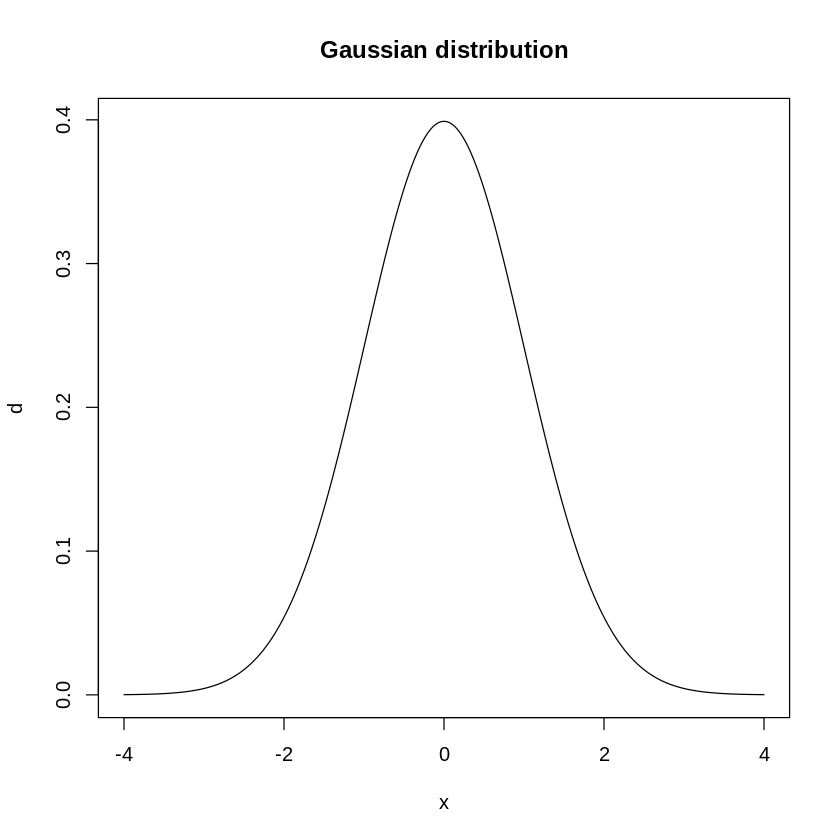

In [18]:
# plot inv_chi2
x = seq(0,1, by=.001)
d = dinvchisq(x, df=10)
plot(x,d, type="l", main="Inverse chi squared")

# plot Gaussian distribution
x = seq(-4,4, by=.001)
d = dnorm(x, 0 , 1)
plot(x,d, type="l", main="Gaussian distribution")


In [19]:
## Compute densities under inv_chi2 and Gaussian see discussion at the end of this first part where 
#  these values are analized

# compute density under inv_chi2 of a variance of a value of 60
dinvchisq(60, df = 10, log = TRUE)

# compute density under standard normal of a mean parameter of value 80
dnorm(80, 0, 1, log = TRUE)

[1] -31.21819

[1] -3200.919

In [20]:
## Set path to model
file   <- file.path("stan_files", "factory", "bullshit.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Whoever did assignment 7 *
//  This file implements the bad model from exercise 2 in assignment 7.

data {

  int<lower=0> N;
  int<lower=0> J;
  vector[J] y[N];
}

parameters {

  vector[J] mu;
  vector<lower=0>[J] sigma;
}

model {

  // priors
  for (j in 1:J){
    mu[j] ~ normal(0, 1);
    sigma[j] ~ inv_chi_square(10);
  }

  // likelihood
  for (j in 1:J)
    y[,j] ~ normal(mu[j], sigma[j]);
}

generated quantities {

  real ypred;

  // Compute predictive distribution
  // for the first machine
  ypred = normal_rng(mu[1], sigma[1]);

}


In [21]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500 # print update every 500 iters
                   )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Ite

In [22]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-287.36486975,-287.0185000,2.4937213,2.4485139,-291.850400,-283.887950,1.0007788,1498.830,2251.351
mu[1],0.12961180,0.1278050,0.9923312,0.9927905,-1.502193,1.765488,0.9995646,9965.366,3006.074
mu[2],0.08574484,0.0870303,1.0034150,1.0350038,-1.540473,1.732266,1.0013294,8503.718,2933.981
mu[3],0.12170037,0.1137740,1.0024217,0.9874909,-1.531913,1.773810,1.0009232,9530.842,3071.660
mu[4],0.08379414,0.0856551,1.0057817,1.0170338,-1.568163,1.725407,0.9996364,8624.693,2929.624
mu[5],0.08078097,0.0861955,1.0410565,1.0252735,-1.642111,1.784439,1.0000306,8260.557,2762.651
mu[6],0.11643059,0.1051395,0.9931553,0.9776368,-1.524715,1.782314,1.0014105,7866.254,2696.979
sigma[1],59.81407368,57.2968000,15.0354415,12.7799379,40.857275,87.259630,1.0002660,8240.435,2807.316
sigma[2],81.41946558,77.8102500,20.2408837,17.0363342,56.095460,119.208450,1.0007807,7358.416,2781.251


### Discussion

By looking at the prior distributions and without looking at the data (we shouldn't when we fix the prior), we can see that perhaps the distribution over the variance is quite informative, since most of the prior density is between $0$ and $0.3$. So one of the issues could be this.

Then if we run the sampler we can check that the Rhat is correct so this prior is not affecting the convergence of the MCMC sampler. Obviously the question (and reason) why this code is bad is due to the kind of predictions we perform.

Although we don't look at our data to fix the prior, we can know what is the scale of the possible measurements of the measurement proceedure. If we know that are between $50$ and $100$ it is clear that the prior over the mean is totally misspecified (unless we normalize the data). We can see that this affects the posterior inferences. For example looking at machine $1$ most of the mass of the posterior mean is in the range $[-1.502193,1.765488]$, which is clearly bullshit.

Moreover if we look at the value of the variance we can see that its range lies between $[40.857275,87.259630]$ which is even more bullshit. This basically tell us that our posterior predictive and posterior distributions (which in this case have analyitical closed forms for the unpooled model) have very thick tails. In other words a Gaussian with mean given by $0$ and variance given by $60$ is not informative at all (see plot below), or in other words, it assigns very low density at each place in the parameter space and so it tends to be kind of a non-informative distribution (i.e converges to a uniform distribution). So in other words our predictions of future machines would not be really informative at all. So bullshit predictions.

So what is happening is that since the prior is constrained to lie around $0$, the data is being explained by huge variances. This is also weird since the prior over the variance is quite informative (no mass above values of $1.0$) so we should not expect the sampler to give values of sigma so big. In other words, we should expect the same behaviour as it happens with the mean (the posterior mean is in the range of the prior). However this would not explain the data at all, and so the sampler decides to explain the data by making the variance huge and forgetting the information provided by the prior.

Obvioulsy there is some explanation on why the sampler decides to sample so big variances, eventhough the prior put low density on them. The answer is simple. If we look at our data it lies in a range around $80$ for machine $1$. If we know compute the likelihood of the prior of a mean of value $80$ and the likelihood of the prior of a variance of value $60$ (the median of the posterior for this parameter in the first machine), we can see that the Gaussian likelihood is way more lower than the inverse chi square distribution. Then higher variances under the prior are more likely than higher means and that is the reason why the variance is overestimated.

The answer is simple. Normalize the data. 

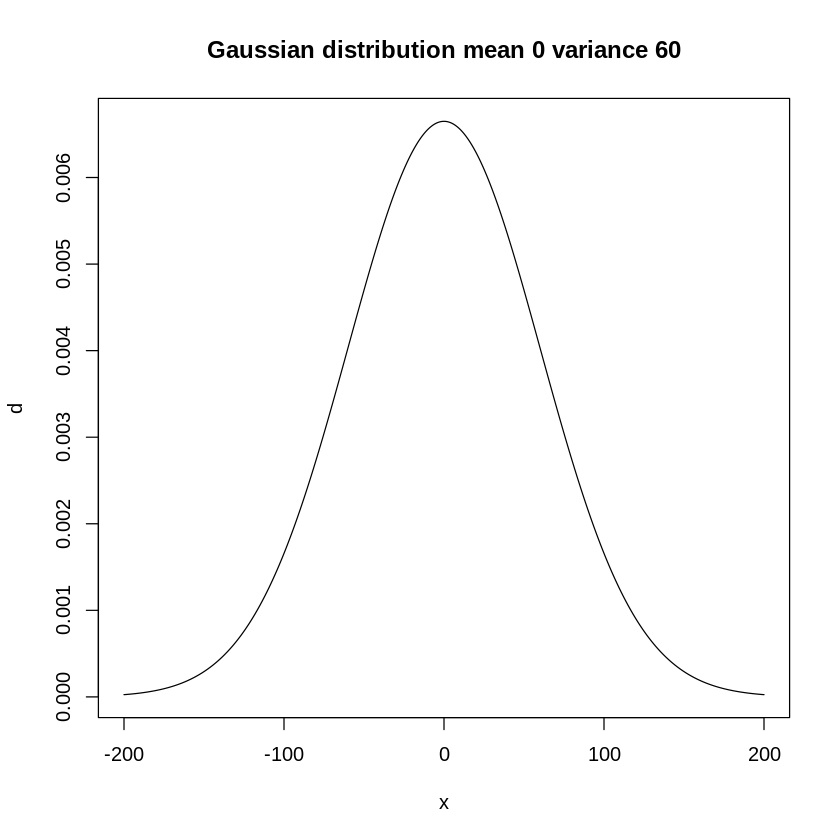

In [23]:
# plot Gaussian distribution
x = seq(-200,200, by=.001)
d = dnorm(x, 0 , 60)
plot(x,d, type="l", main="Gaussian distribution mean 0 variance 60")

## Unpooled model

## a)

First standarize the data to avoid the aforementioned issue. Then the generative model is given by:

$$
\begin{array}{c}
&y_{ij}   \sim \mathcal{N}(\mu_j,\sigma_j)\\
&\mu_j    \sim \mathcal{N}(0,1)\\
&\sigma_j \sim \text{Inv-}\chi^2(10)
\end{array}
$$

for each machine $j$ and each datapoint $i$ in each machine.  In the unpooled model each machine is modeled independently from the others by setting its own model. In this way no information between machines can flow. 

## b)

In [24]:
## Set path to model
file   <- file.path("stan_files", "factory", "unpooled_abc.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas *
//  This file implements the unpooled model in assignment 7 exercise 2.

data {

  int<lower=0> N;
  int<lower=0> J;
  matrix[N,J]  y; // cannot be array of vectors otherwise when normalizing cannot use - since is not defined between arrays and scalars.
}

transformed data {
  // normalize the data so that standard prior is correctly specified.
  matrix[N,J] y_std;

  for (j in 1:J){
    y_std[,j]  = (y[,j] - mean(y[,j]))  / sd(y[,j]);
  }
}

parameters {

  vector[J] mu;
  vector<lower=0>[J] sigma;
}

model {

  // priors
  for (j in 1:J){
    mu[j] ~ normal(0, 1);
    sigma[j] ~ inv_chi_square(10);
  }

  // likelihood
  for (j in 1:J)
    y_std[,j] ~ normal(mu[j], sigma[j]);
}

generated quantities {

  // Compute posterior predictive distribution for the sixth machine
  real y_pred = normal_rng(mu[6], sigma[6]);
  y_pred = y_pred * sd(y[,6]) + mean(y[,6]); // undoo scaling so that predictions are on the original range.

}


In [25]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500,  # print update every 500 iters
                      step_size       = 0.1   # set initial step size otherwise getting scale parameter being 0 and
                                              # this is not possible since it is contrained. So there is a huge step
                                              # size during warm up that makes dynamics go into this region.
                    )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Ite

In [26]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-13.473287123,-13.110400000,2.6068616,2.5709025,-18.2810900,-9.8031290,1.0006539,1420.683,2375.446
mu[1],0.001353825,0.002022245,0.3257714,0.3115847,-0.5274054,0.5414838,1.0018984,5437.981,2592.104
mu[2],0.001537300,0.003116295,0.3163216,0.2997316,-0.5043802,0.5273211,1.0015723,5230.240,2528.567
mu[3],0.015502404,0.013269550,0.3238770,0.3073727,-0.4945226,0.5264289,1.0020486,4850.843,2577.875
mu[4],-0.003650611,0.003473150,0.3177625,0.2960582,-0.5363638,0.5029932,1.0021568,4462.561,2641.738
mu[5],-0.003551478,-0.004879600,0.3172080,0.2980641,-0.5269538,0.5177725,1.0008040,5159.637,2908.587
mu[6],0.002394998,-0.005873805,0.3243694,0.3065901,-0.5247940,0.5439779,1.0010580,4865.383,2873.943
sigma[1],0.749362128,0.714015000,0.1961120,0.1660445,0.5070847,1.1315880,1.0033087,5486.567,2838.053
sigma[2],0.752401295,0.717781500,0.1965906,0.1689645,0.5024264,1.1249860,1.0014012,5994.289,2829.290


In [27]:
posterior_draws <- fit$draws(format = 'df')

## c)

### i)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



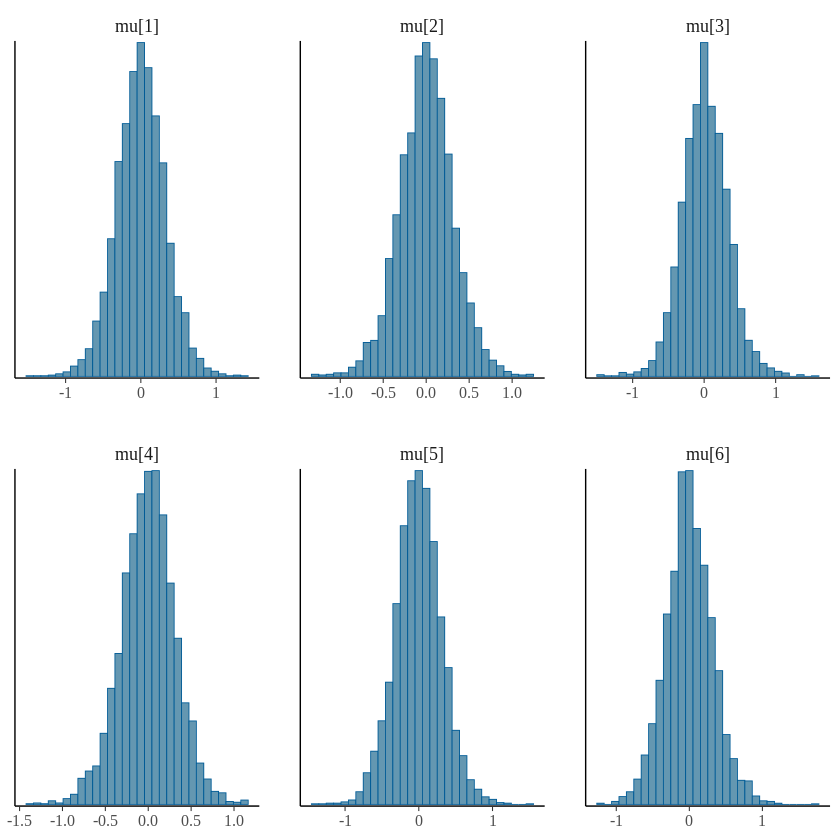

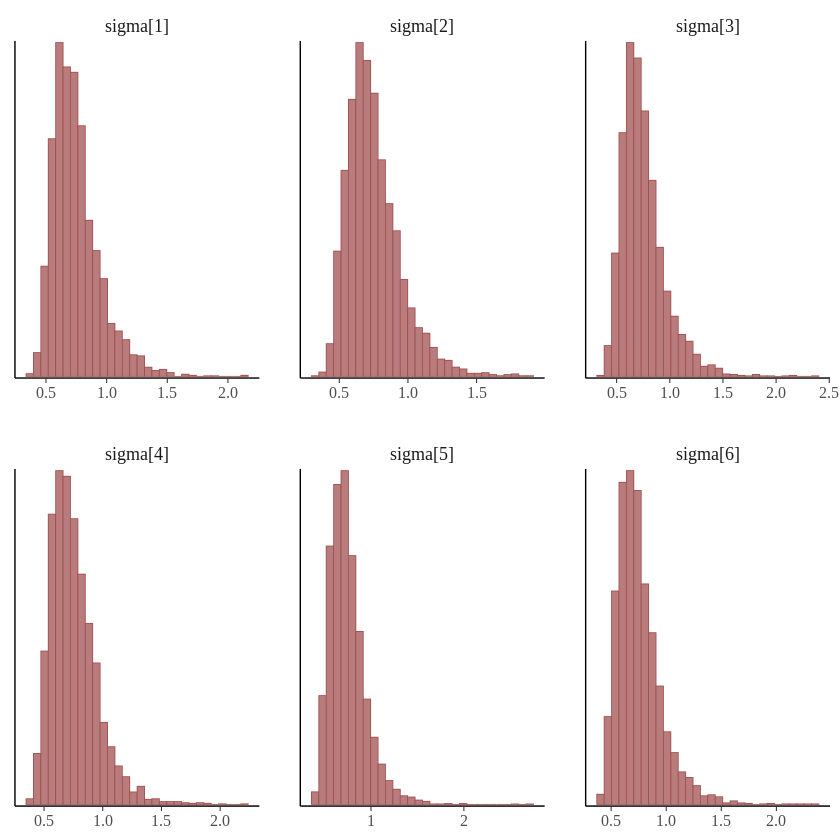

In [28]:
color_scheme_set("blue")
mcmc_hist( posterior_draws , regex_pars = c('mu'))

color_scheme_set("red")
mcmc_hist( posterior_draws , regex_pars = c('sigma'))

### ii)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



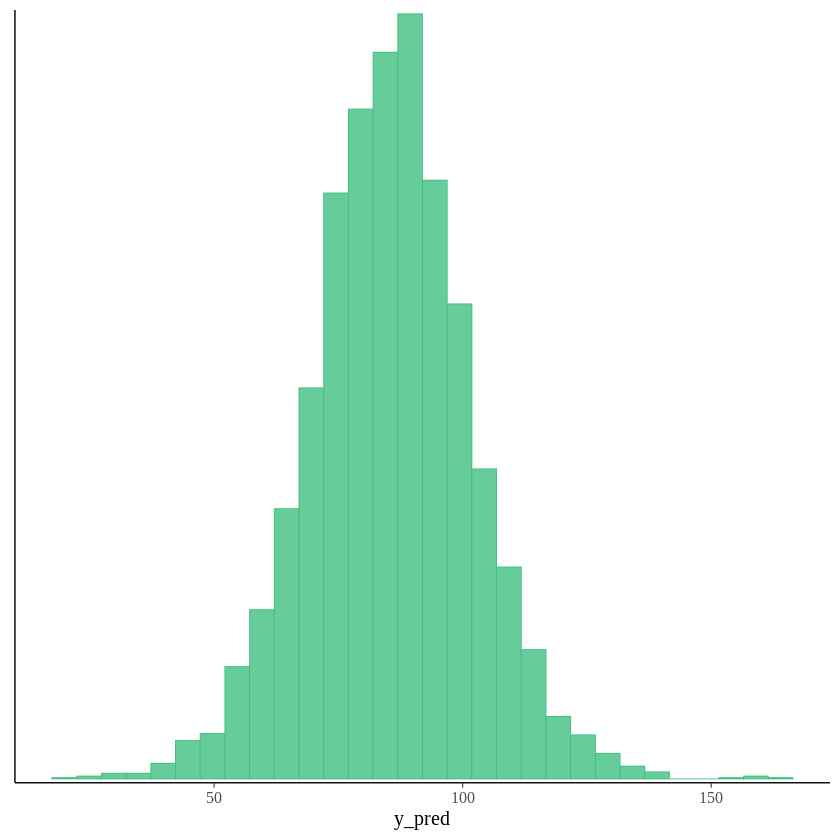

In [29]:
color_scheme_set("green")
mcmc_hist( posterior_draws , pars = c('y_pred'))

We can check the posterior predictive has student-t shape as expected.

### iii)

We would like to sample a new machine based on our data. With the generative model the posterior distribution over the machine's sampling distribution is fixed and given by the prior $\mu_j    \sim \mathcal{N}(0,1)$. So there is no way the data can inform how the distribution over the machine is re-shaped. This is a problem of not extending the hierarchy and fix a prior distribution for the machine's generating distribution.

Moreover, this cannot be done in the generated quantities block from stan, since this block is executed once per draw, so there is no way we can just sample once from the prior and $N$ times from the sampling distribution, see https://discourse.mc-stan.org/t/specifying-the-number-of-samples-for-rng/2384/3 . So I'll do this manually.

In [30]:
## fix seed
set.seed(1)

## generate a new machine
mu_7    = rnorm(1, 0 , 1)
sigma_7 = rinvchisq(1, df = 10)

## generate observations for this new machine
y_7     = rnorm( 4000, mu_7, sigma_7 )

## wrapping so that mcmc_hist understands
dim(y_7)   <- c(4000,1)
y_7 <- as.data.frame(y_7)
names(y_7) <- 'y_7'

In [31]:
print(mu_7)
print(sigma_7)

[1] -0.6264538
[1] 0.1020825


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



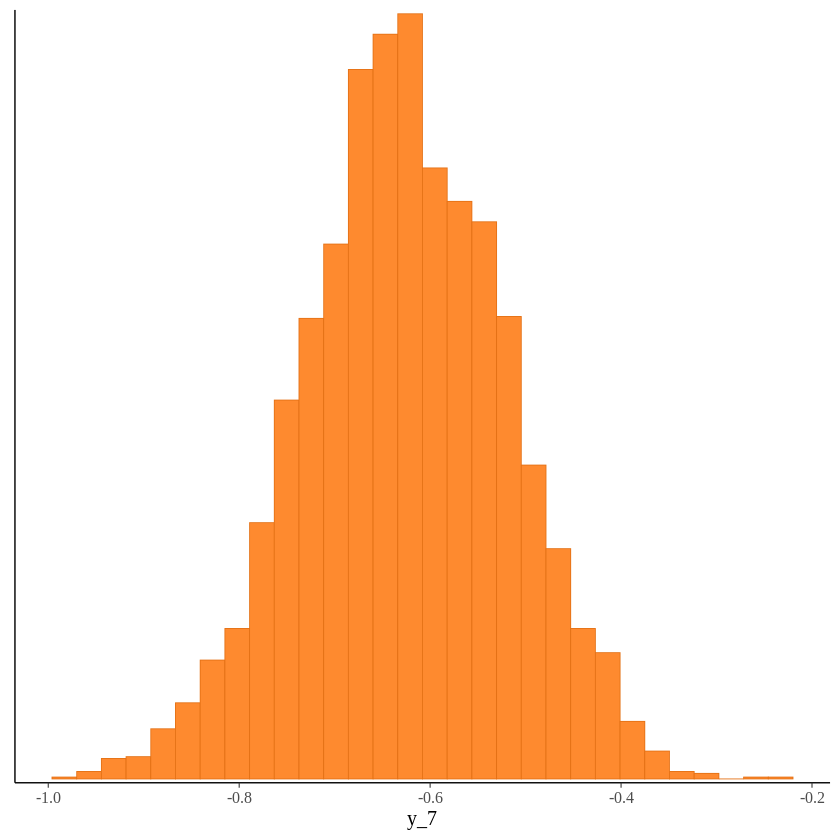

In [32]:
color_scheme_set("orange")
mcmc_hist( y_7 )

## d)

The prior distribution is know less informative than the one used in the previous exercises. This means that with fewer data the posterior variance, for example, can be over estimated, and the posterior distribution of the mean will be more heavy tailed.

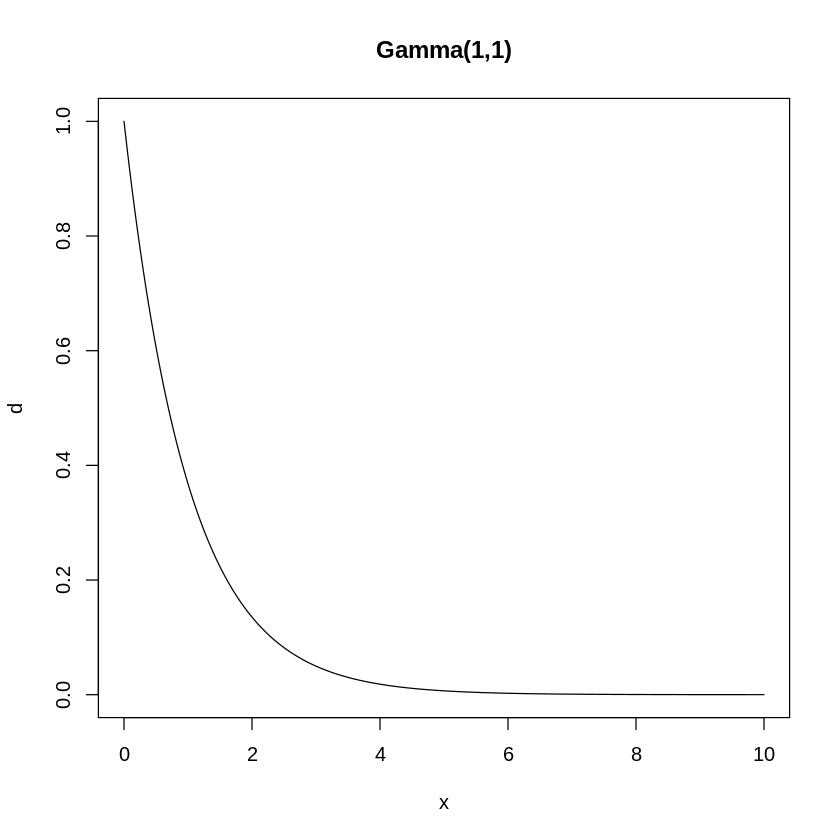

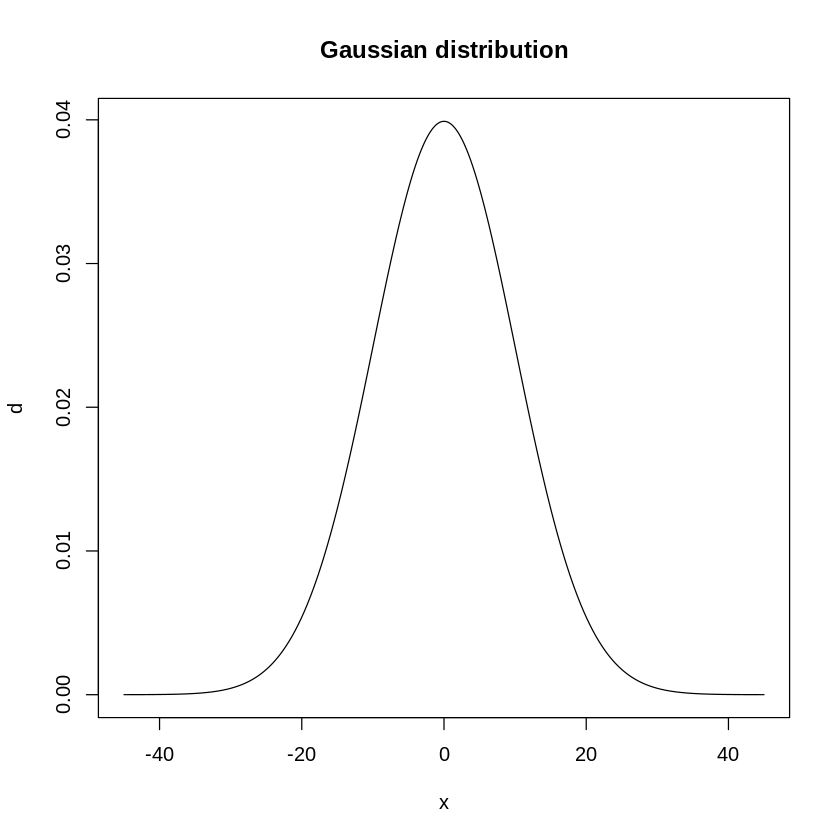

In [33]:
## plot prior to use
# plot gamma
x = seq(0,10, by=.001)
d = dgamma(x, shape = 1, scale = 1)
plot(x,d, type="l", main="Gamma(1,1)")

# plot Gaussian distribution
x = seq(-45,45, by=.001)
d = dnorm(x, 0 , 10)
plot(x,d, type="l", main="Gaussian distribution")

In [34]:
## Set path to model
file   <- file.path("stan_files", "factory", "unpooled_d.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas *
//  This file implements the unpooled model in assignment 7 exercise 2 part d). This aims at changing the prior over the hyperparameters

data {

  int<lower=0> N;
  int<lower=0> J;
  matrix[N,J]  y; // cannot be array of vectors otherwise when normalizing cannot use - since is not defined between arrays and scalars.
}

transformed data {
  // normalize the data so that standard prior is correctly specified.
  matrix[N,J] y_std;

  for (j in 1:J){
    y_std[,j]  = (y[,j] - mean(y[,j]))  / sd(y[,j]);
  }
}

parameters {

  vector[J] mu;
  vector<lower=0>[J] sigma;
}

model {

  // priors
  for (j in 1:J){
    mu[j] ~ normal(0, 10);
    sigma[j] ~ gamma(1,1);
  }

  // likelihood
  for (j in 1:J)
    y_std[,j] ~ normal(mu[j], sigma[j]);
}

generated quantities {

  // Compute posterior predictive distribution for the sixth machine
  real y_pred = normal_rng(mu[6], sigma[6]);
  y_pred = y_pred * sd(y[,6]) + mean(y[,6]); // undoo scaling so that predictions are

In [35]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500,  # print update every 500 iters
                      step_size       = 0.1   # set initial step size otherwise getting scale parameter being 0 and
                                              # this is not possible since it is contrained. So there is a huge step
                                              # size during warm up that makes dynamics go into this region.
                    )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Ite

In [36]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-2.443641e+01,-24.095050000,2.7198039,2.5839494,-29.5003150,-20.6549050,1.001072,1419.769,2108.840
mu[1],-1.865961e-02,-0.022328550,0.5703572,0.4901172,-0.9186322,0.8442256,1.000474,3017.890,2084.998
mu[2],3.752424e-03,-0.004400940,0.5520756,0.4651634,-0.8349565,0.8841641,1.003992,2892.599,2043.118
mu[3],-1.587898e-02,-0.011126800,0.5661537,0.4646792,-0.8985644,0.8911834,1.001677,2414.059,1638.251
mu[4],3.578954e-03,-0.002055240,0.5344232,0.4427040,-0.8634060,0.8630971,1.001111,2899.770,2049.475
mu[5],-3.103882e-03,0.007196595,0.5389759,0.4571412,-0.9056566,0.8646878,1.002101,2403.730,2112.178
mu[6],1.517908e-04,-0.008512470,0.5527204,0.4693489,-0.8635405,0.9021477,1.000592,2928.779,2133.340
sigma[1],1.159272e+00,1.058455000,0.4445822,0.3459365,0.6552839,2.0054050,1.000712,2890.381,2129.153
sigma[2],1.155449e+00,1.054450000,0.4621915,0.3364575,0.6546457,2.0126300,1.000671,2754.066,2383.517


The posterior credible interval for the mean of the first machine is $[-0.912 , 0.844]$. We can see that this posterior interval is wider than with the more informative prior.

## Pooled model

## a)

First standarize the data to avoid the aforementioned issue. Then the generative model is given by:

$$
\begin{array}{c}
&y_{ij}   \sim \mathcal{N}(\mu,\sigma)\\
&\mu    \sim \mathcal{N}(0,1)\\
&\sigma \sim \text{Inv-}\chi^2(10)
\end{array}
$$

which means that all the machines are modelled using the same prior distribution. This will make the prior less informative about the posterior (at least with this amount of data per machine) since know we have more data. So it is expected to observe tighter credible intervals.

On the other hand, the problem with the pooled model, is that it will tend to "summarize" the behaviour of all the machines in just one and it is likely that we observe posterior intervals that do not fit well with our observations about the individual machines. Let's see what happens.

## b)

In [37]:
## Set path to model
file   <- file.path("stan_files", "factory", "pooled_abc.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas *
//  This file implements the pooled model in assignment 7 exercise 2.

data {

  int<lower=0> N;
  int<lower=0> J;
  matrix[N,J]  y; // cannot be array of vectors otherwise when normalizing cannot use - since is not defined between arrays and scalars.

}

transformed data {

  vector[N*J] y_resh; // to reshape the matrix into a vector
  y_resh = to_vector(y);

  // normalize the data so that standard prior is correctly specified.
  vector [N*J] y_std;

  y_std = (y_resh - mean(y_resh)) / sd(y_resh);

}

parameters {

  real mu;
  real<lower=0> sigma;

}

model {

  // priors
  mu ~ normal(0,1);
  sigma ~ inv_chi_square(10);

  // likelihood
  y_std ~ normal( mu , sigma );

}

generated quantities {

  // Compute posterior predictive distribution for the sixth machine
  real y_pred = normal_rng(mu, sigma);
  y_pred = y_pred * sd(y) + mean(y); // undoo scaling so that predictions are on the original range.

}


In [38]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500,  # print update every 500 iters
                      step_size       = 0.1   # set initial step size otherwise getting scale parameter being 0 and
                                              # this is not possible since it is contrained. So there is a huge step
                                              # size during warm up that makes dynamics go into this region.
                    )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Ite

In [39]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-15.77387660,-15.468900000,1.0102030,0.7424120,-17.8305550,-14.8068000,1.000792,1904.179,2689.914
mu,0.00525401,0.003620145,0.1706128,0.1674947,-0.2746523,0.2901963,1.000044,3223.228,2228.326
sigma,0.95636967,0.943925500,0.1196670,0.1170209,0.7836080,1.1696810,1.000702,3056.477,2299.420
y_pred,92.95518202,92.696150000,17.7697101,17.1465655,63.3613250,122.0476000,1.001198,4014.177,3950.309


The posterior mean credible interval is given by $[-0.27,0.29]$ and the posterior sigma interval by $[0.78,1.17]$. If we compare with the credible intervals from the unpooled model, we can see that first this interval is tighter, due to having more data the posterior tends to concentrate more around the maximum likelihood estimator provided this model is identifiable. Moreover, we can see that the unpooled model has posterior intervals that are totally disconected from this posterior interval. 

If we look at the normalized matrix below, we can see that for many machines most of the training observations are out from the posterior credible intervals, clearly reflecting that the model is not representing our data. This is because the model has to explain "all" the machines and thus misses data from individual ones. This is clearly an undesired behavior.

In [40]:
factory_as_matrix = data.matrix(factory)
mean  = colMeans(factory_as_matrix)
stdev = colSds(factory_as_matrix)

factory_as_matrix <- sweep(factory_as_matrix, 2, mean, "-")
factory_as_matrix <- sweep(factory_as_matrix, 2, stdev, "/")

print(factory_as_matrix)

             V1         V2         V3         V4         V5         V6
[1,]  0.3565216  0.9137461  1.0316909 -0.8718999 -1.0213244 -1.5086579
[2,]  0.8149065  0.2368971  0.4064237  0.9775847  0.6499337  0.3121361
[3,]  0.8149065  0.6599278  0.3282653  0.5812666  1.2070197  0.9364084
[4,] -1.5279497 -0.1861335 -0.1406851 -1.2682180 -1.0213244 -0.4682042
[5,] -0.4583849 -1.6244376 -1.6256947  0.5812666  0.1856953  0.7283176


In [41]:
posterior_draws <- fit$draws(format = 'df')

## c)

### i)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



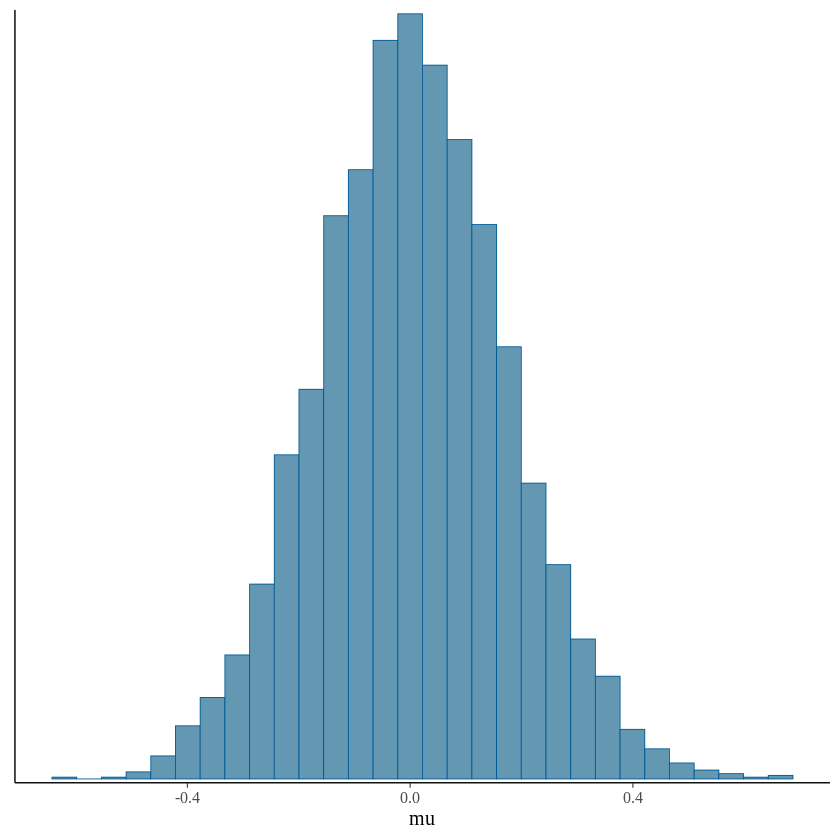

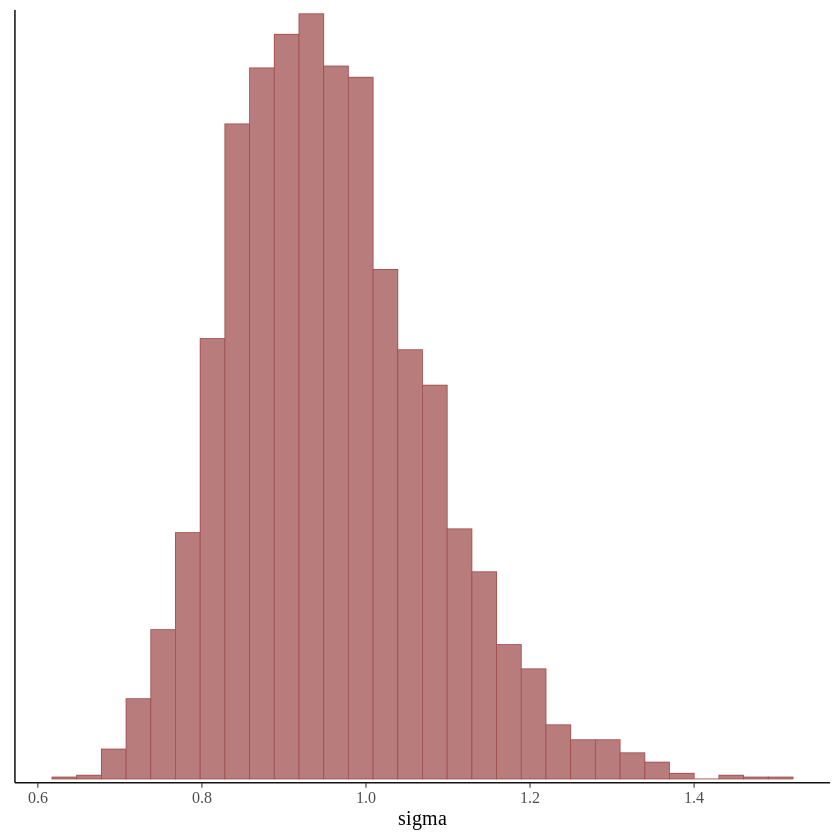

In [42]:
color_scheme_set("blue")
mcmc_hist( posterior_draws , regex_pars = c('mu'))

color_scheme_set("red")
mcmc_hist( posterior_draws , regex_pars = c('sigma'))

### ii)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



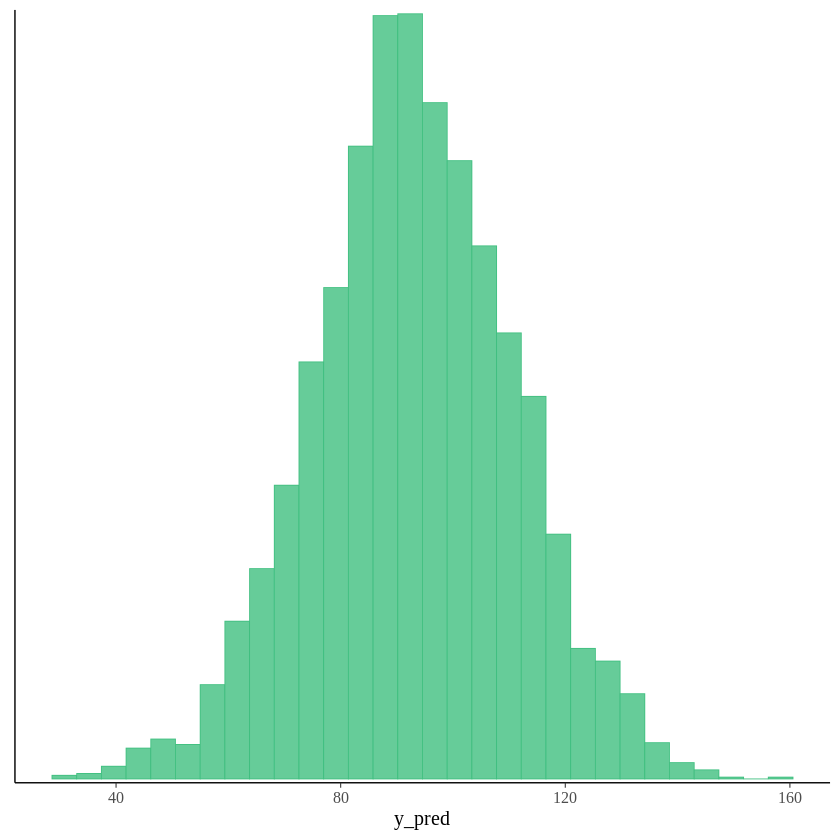

In [43]:
color_scheme_set("green")
mcmc_hist( posterior_draws , pars = c('y_pred'))

### iii)

In [44]:
## fix seed
set.seed(1)

## generate a new machine
mu_7    = rnorm(1, 0 , 1)
sigma_7 = rinvchisq(1, df = 10)

## generate observations for this new machine
y_7     = rnorm( 4000, mu_7, sigma_7 )

## wrapping so that mcmc_hist understands
dim(y_7)   <- c(4000,1)
y_7 <- as.data.frame(y_7)
names(y_7) <- 'y_7'

In [45]:
print(mu_7)
print(sigma_7)

[1] -0.6264538
[1] 0.1020825


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



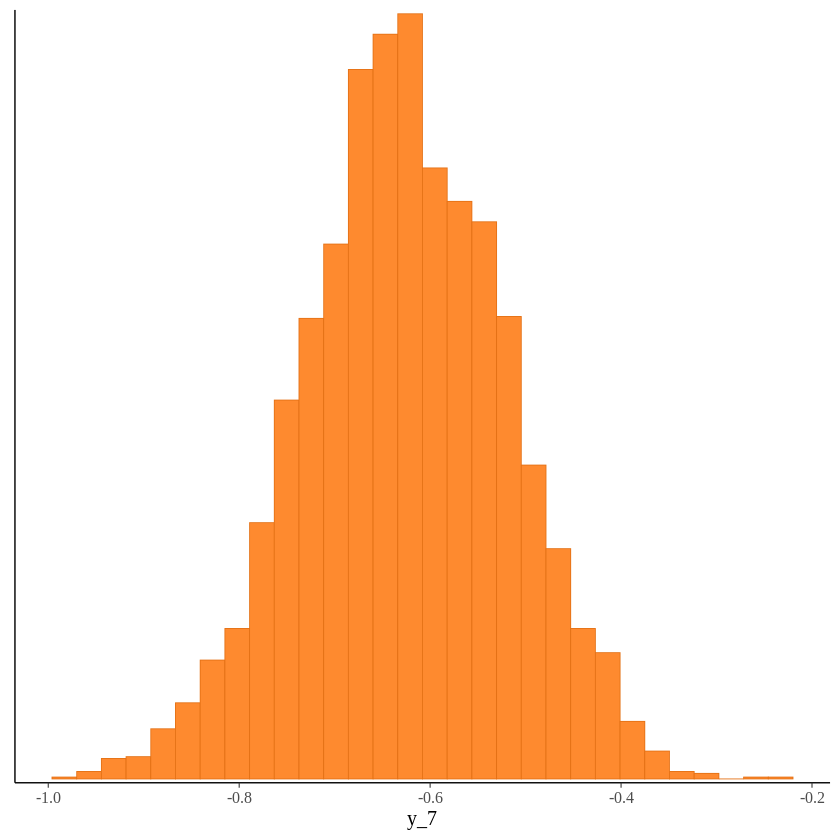

In [46]:
color_scheme_set("orange")
mcmc_hist( y_7 )

Same as before the seventh machine cannot be sampled from the posterior distribution over the hyperparameters since for this models it coincides with the prior.

## d)

The prior distribution is know less informative than the one used in the previous exercises. This means that with fewer data the posterior variance, for example, can be over estimated, and the posterior distribution of the mean will be more heavy tailed. However in this case since there is more data this effect will not be seen as much as in the unpooled model. Neverthless, we will see that the posterior credible interval is wider than with the other priors.

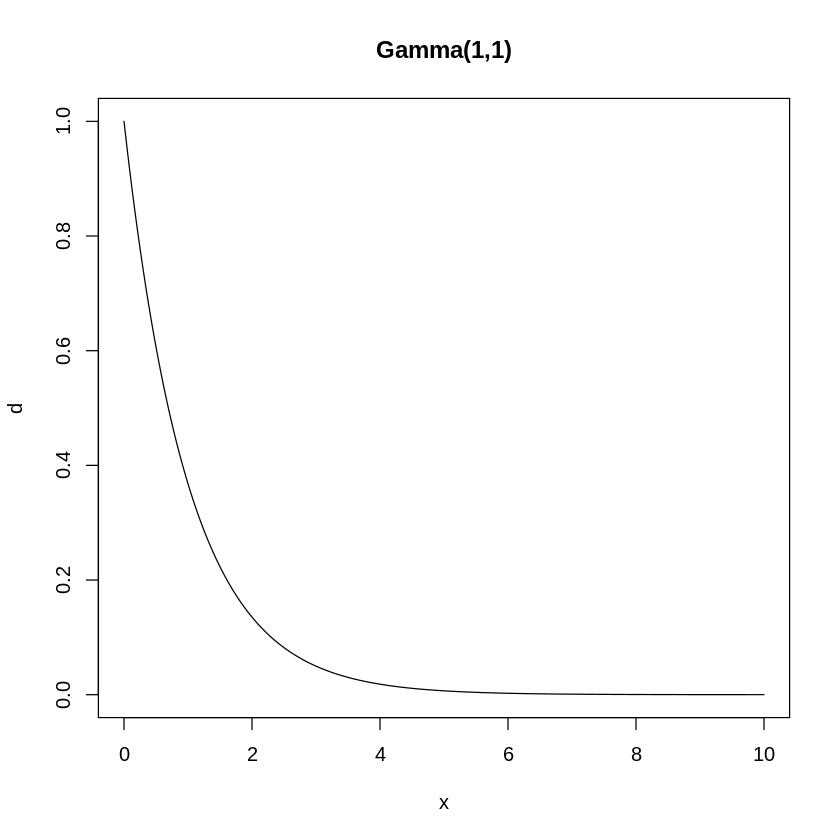

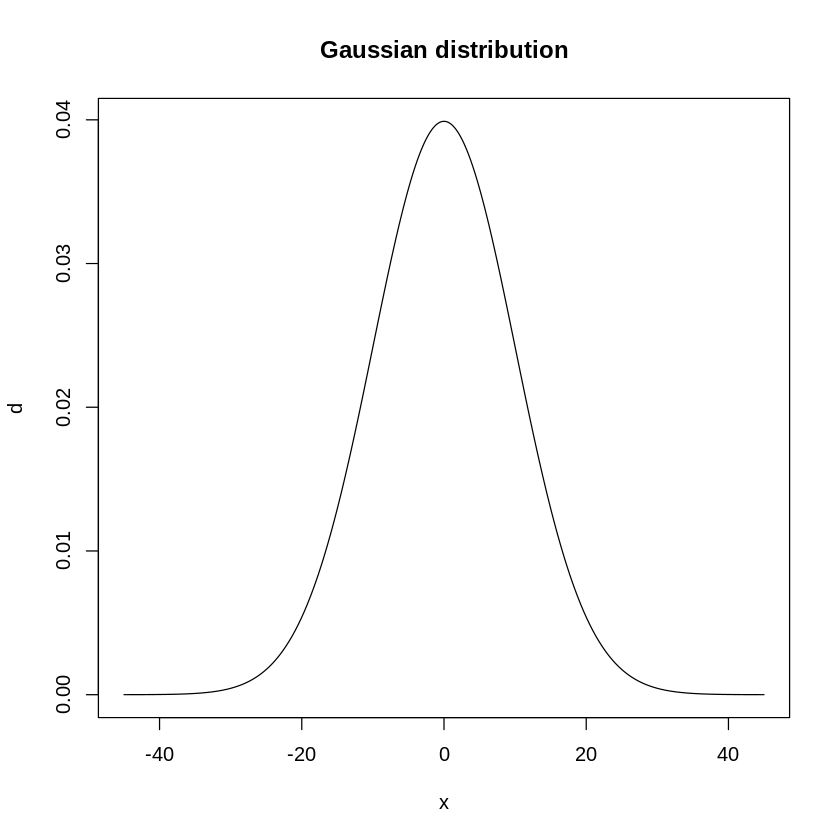

In [47]:
## plot prior to use
# plot gamma
x = seq(0,10, by=.001)
d = dgamma(x, shape = 1, scale = 1)
plot(x,d, type="l", main="Gamma(1,1)")

# plot Gaussian distribution
x = seq(-45,45, by=.001)
d = dnorm(x, 0 , 10)
plot(x,d, type="l", main="Gaussian distribution")

In [48]:
## Set path to model
file   <- file.path("stan_files", "factory", "pooled_d.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas *
//  This file implements the pooled model in assignment 7 exercise 2 part d. We change the prior over hyperparameters

data {

  int<lower=0> N;
  int<lower=0> J;
  matrix[N,J]  y; // cannot be array of vectors otherwise when normalizing cannot use - since is not defined between arrays and scalars.

}

transformed data {

  vector[N*J] y_resh; // to reshape the matrix into a vector
  y_resh = to_vector(y);

  // normalize the data so that standard prior is correctly specified.
  vector [N*J] y_std;

  y_std = (y_resh - mean(y_resh)) / sd(y_resh);

}

parameters {

  real mu;
  real<lower=0> sigma;

}

model {

  // priors
  mu ~ normal(0,10);
  sigma ~ gamma(1,1);

  // likelihood
  y_std ~ normal( mu , sigma );

}

generated quantities {

  // Compute posterior predictive distribution for the sixth machine
  real y_pred = normal_rng(mu, sigma);
  y_pred = y_pred * sd(y) + mean(y); // undoo scaling so that predictions are on the original range.

}


In [49]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500,  # print update every 500 iters
                      step_size       = 0.1   # set initial step size otherwise getting scale parameter being 0 and
                                              # this is not possible since it is contrained. So there is a huge step
                                              # size during warm up that makes dynamics go into this region.
                    )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Ite

In [50]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-16.524459625,-16.207750000,1.0237044,0.7346283,-18.5865200,-15.5469000,1.003722,1525.128,2024.687
mu,0.001248626,0.003650215,0.1866634,0.1808831,-0.3091377,0.3058977,1.000756,2786.559,2104.695
sigma,1.028571574,1.017110000,0.1396279,0.1351605,0.8269532,1.2788130,1.002715,3050.296,2768.076
y_pred,93.091339100,93.304200000,19.2140632,18.2657061,61.1462350,124.2992000,1.000532,4061.376,4053.938


The posterior credible interval for the mean of the first machine is $[-0.30 , 0.30]$. We can see that this posterior interval is wider than with the more informative prior.

## Hierarchical model

## a)

First standarize the data to avoid the aforementioned issue. Then the generative model is given by:

$$
\begin{array}{c}
& y_{ij} \sim \mathcal{N}(\mu_j,\sigma)   \\
& \mu_j  \sim \mathcal{N}(\mu_0,\sigma_0) \\
& \sigma \sim \text{Inv-}\chi^2(\tau)\\
& \mu_0 \sim \mathcal{N}(0,1) \\
& \sigma_0 \sim \text{Inv-}\chi^2(10)\\
& \tau   \sim \text{Inv-}\chi^2(10)
%
%
%
\end{array}
$$

The idea of this hierarchical model is to have an individual model per machine, given by $\mathcal{N}(\mu_0,\sigma_0)$, which explains particularities of the individual model. Then, a machine distribution is placed on top of this distribution and shared by all the machines. With this, the measurements of the machines can inform the posterior distribution of other machines, something particularly helpfull with not too much data. We can also have a posterior distribution over the machine generating mechanism and thus simulate potential new machines based on our observations, and not on our prior. It is expected that the data is know correctly modelled but with credible intervals being affected by measurements from other machines. We can also check how probably a pooled or totally unpooled model explain the data and integrate over the uncertainties of different poolings. Let's see what do we observe. 

## b)

In [51]:
## Set path to model
file   <- file.path("stan_files", "factory", "hierarchical_abc.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas *
//  This file implements the hierarchical model in assignment 7 exercise 2.

data {

  int<lower=0> N;
  int<lower=0> J;
  matrix[N,J]  y; // cannot be array of vectors otherwise when normalizing cannot use - since is not defined between arrays and scalars.
}

transformed data {
  // normalize the data so that standard prior is correctly specified.
  matrix[N,J] y_std;

  for (j in 1:J){
    y_std[,j]  = (y[,j] - mean(y[,j]))  / sd(y[,j]);
  }
}

parameters {

  // likelihood parameters
  vector[J] mu;
  real<lower=0> sigma;

  // prior parameters
  real mu_0;
  real<lower=0> sigma_0;
  real<lower=0> tau;
}

model {

  // hyperpriors distributions
  sigma_0 ~ inv_chi_square(10);
  tau     ~ inv_chi_square(10);
  mu_0    ~ normal(0,1);

  // priors
  sigma ~ inv_chi_square( tau );
  for (j in 1:J){
    mu[j] ~ normal(mu_0, sigma_0);
  }

  // likelihood
  for (j in 1:J)
    y_std[,j] ~ normal(mu[j], sigma);
}

generated quantities {

  // Compute posterior p

In [52]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500,   # print update every 500 iters
                      # step_size       = 0.1  # Remove this since it implies 32 divergences. The default 
                                               # value is better
                      adapt_delta     = 0.95   ## This value is recommended here http://avehtari.github.io/BDA_R_demos/demos_rstan/cmdstanr_demo.html#8_comparison_of_k_groups_with_hierarchical_models
                                               #  when there is a small number of divergent transitions
                    )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 1 finished in 0.1 seconds.
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 

See https://mc-stan.org/misc/warnings for details.




In [53]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,6.639769704,7.023075000,3.2123732,3.08388213,0.57159010,11.1508300,1.0026590,721.1444,1460.567
mu[1],-0.006671466,-0.006820945,0.1928256,0.18752295,-0.32333905,0.3060284,1.0013250,931.4132,1752.642
mu[2],-0.005638247,-0.004362570,0.1873277,0.18119818,-0.31293170,0.2955289,1.0011470,995.2459,1559.564
mu[3],-0.006708107,-0.005216125,0.1924046,0.18767418,-0.32675700,0.3034965,1.0013134,969.4128,1590.941
mu[4],-0.006749950,-0.004197910,0.1903664,0.18284164,-0.31109765,0.2996317,1.0025698,956.6833,1841.432
mu[5],-0.008483228,-0.005969500,0.1924851,0.18759041,-0.33077285,0.2912637,1.0019401,968.0574,1628.561
mu[6],-0.003801546,-0.007263350,0.1915997,0.18154860,-0.31466510,0.3210123,1.0011908,960.3807,1636.147
sigma,0.948001793,0.932361500,0.1334720,0.12437976,0.75692020,1.1852980,1.0005563,2135.6094,2199.899
mu_0,-0.006937238,-0.008689090,0.1682509,0.16169148,-0.27622625,0.2764449,1.0018322,790.0121,1053.107


We observe one divergence in the MCMC sampling. The Rhat values are correct, indicating a correct mixing. We will know analyze a bit further the output of the MCMC proceedure to learn what Stan shows. We also plot some stuff with Bayes plot. In particular let's see the degree of dependence in the posterior so that we can check if a reparameterization helps. Also, eventhough the Rhat is okay, we can see that the effective sample size is not too big. This means that the autocorrelation is high. The divergence and this observation implies that the posterior has regions of high curvature, thus the step size is set to a small value during warm up and so the autocorrelation increases in the regions where a bigger sample size could be use. All this things can be started to solve with a reparameterization. 

In [54]:
posterior_draws <- fit$draws(format = 'df')

## c)

### i)

Compared to the unpooled model we can see a cleaer difference in the histograms of the posterior distribution over mu. While for the unpooled model most of the distribution lies between $-1$ and $1$ in this case observe the range is narrower. We would require further discussion but I am tired now so will do at other moment. Also I am not really an expert yet on hierarchical models so I don't want to put absurd or perhaps non-sense reasoning.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



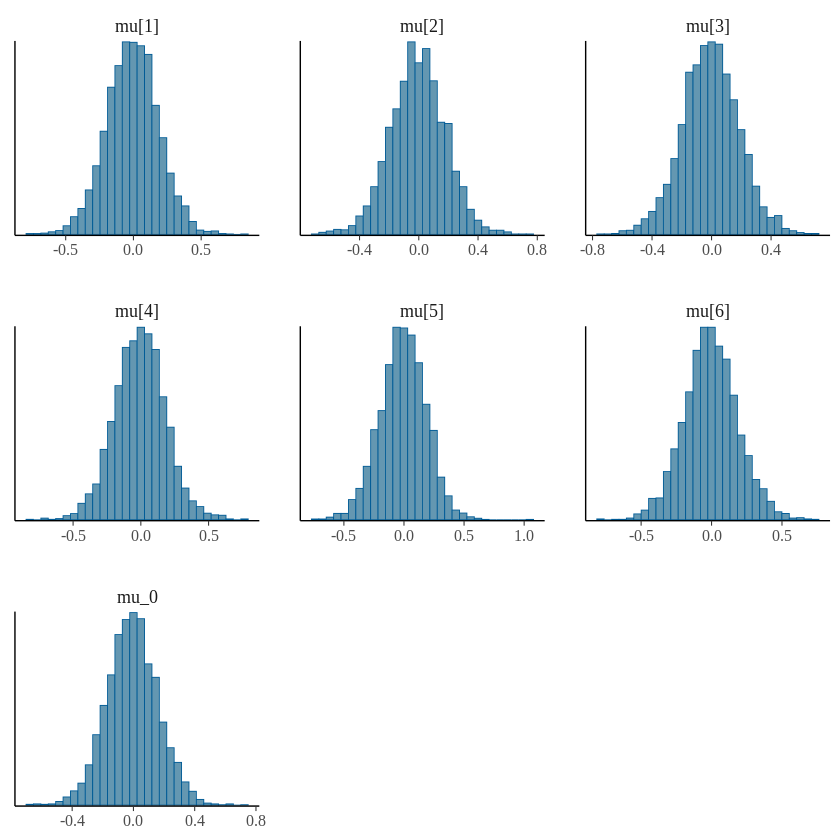

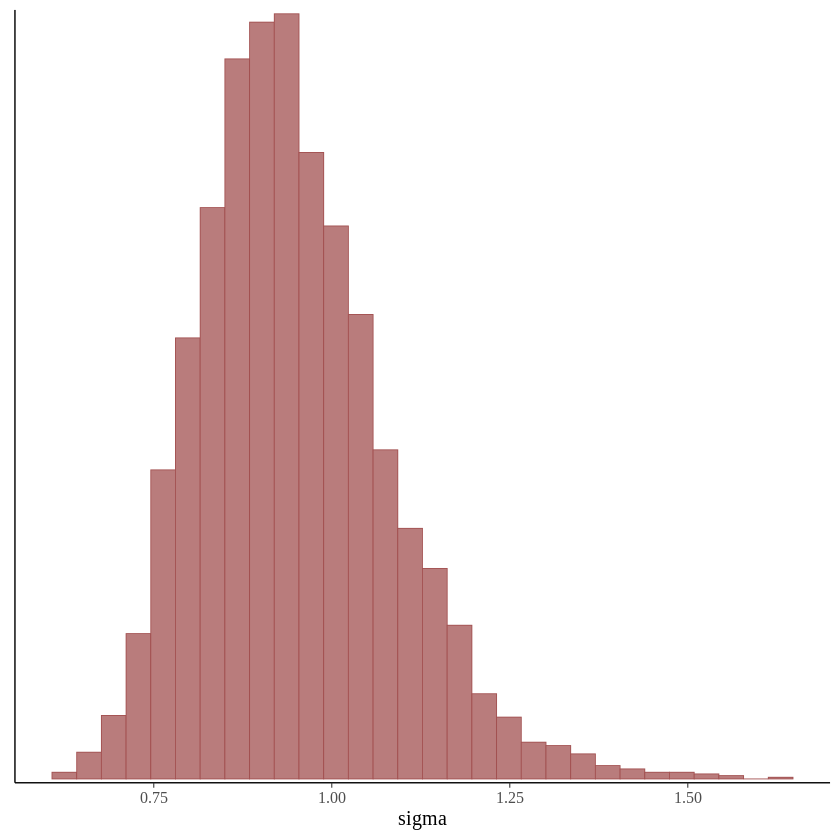

In [55]:
color_scheme_set("blue")
mcmc_hist( posterior_draws , regex_pars = c('mu'))

color_scheme_set("red")
mcmc_hist( posterior_draws , pars = c('sigma'))

### ii)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



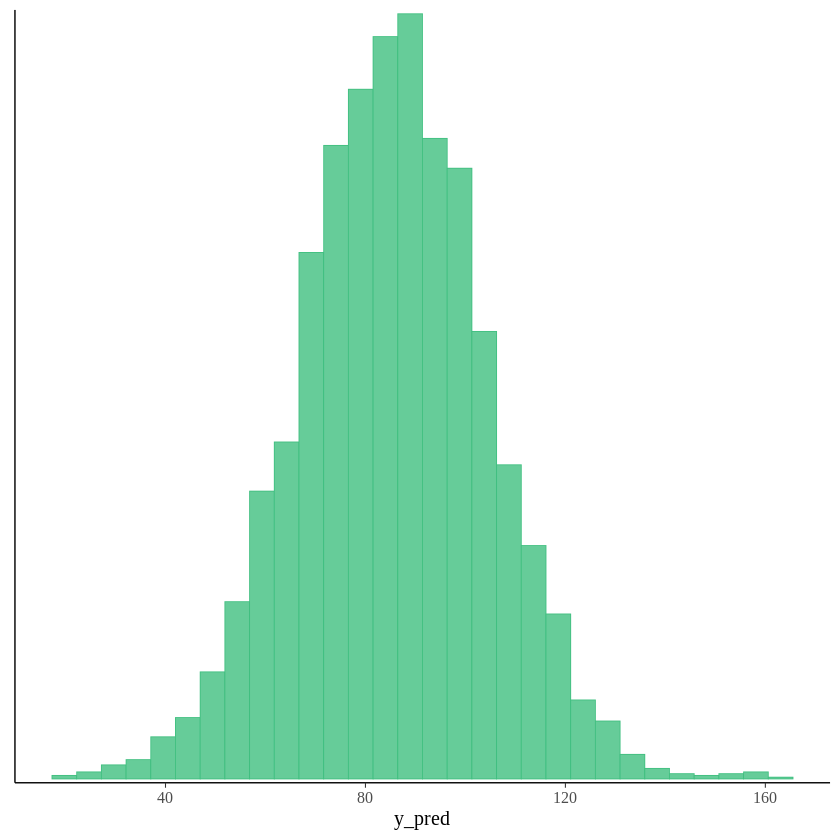

In [56]:
color_scheme_set("green")
mcmc_hist( posterior_draws , pars = c('y_pred'))

### iii)

Sampling a new machine is performed as follows. We first sample from the posterior distribution over the hyperparameters of the prior, given the data. Since we have $4000$ samples we select one uniformly. Then given this sample we sample a new machine from the prior, and given the parameters of the prior we sample data from the observation model.

Thus, we need to sample first from $p(\mu_0,\sigma_0,\tau\mid y)$. Then given this sample we draw a sample $\mu,\sigma$ from $\mathcal{N}(\mu_0,\sigma_0)\text{Inv-}\chi^2(\tau)$. And finally given this sample we generate observations from the sampling distribution $p(y \mid \mu ,\sigma)$. For $\tau$ I pick the median since I observe that different seeds (in the cell below) lead to very different values for sigma_7. Check for example seeds 1,2,3. With the median it gives a narrow sampling distribution which looks rather more informative that using a huge variance. I have plotted the histogram for $p(\tau\mid y)$ and looks that the median is a reasonable high picked value for this selection.

In [57]:
## Sample from posterior distribution over hyperparameters
pos_mu0_sigma0_tau <- data.matrix( posterior_draws[c('mu_0','sigma_0','tau')] )

## Draw three uniform samples (one used per column)
set.seed(2)
u <- sample.int(4000, 3)

mu_0    <- pos_mu0_sigma0_tau[ u[1], 1 ]
sigma_0 <- pos_mu0_sigma0_tau[ u[2], 2 ]
tau     <- 0.132 # pos_mu0_sigma0_tau[ u[3], 3 ] # 

## Draw a sample from the prior over the machines to generate a new machine
mu_7    = rnorm(1, mu_0 , sigma_0)
sigma_7 = rinvchisq(1, df = tau)




Warning message:
“Dropping 'draws_df' class as required metadata was removed.”


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



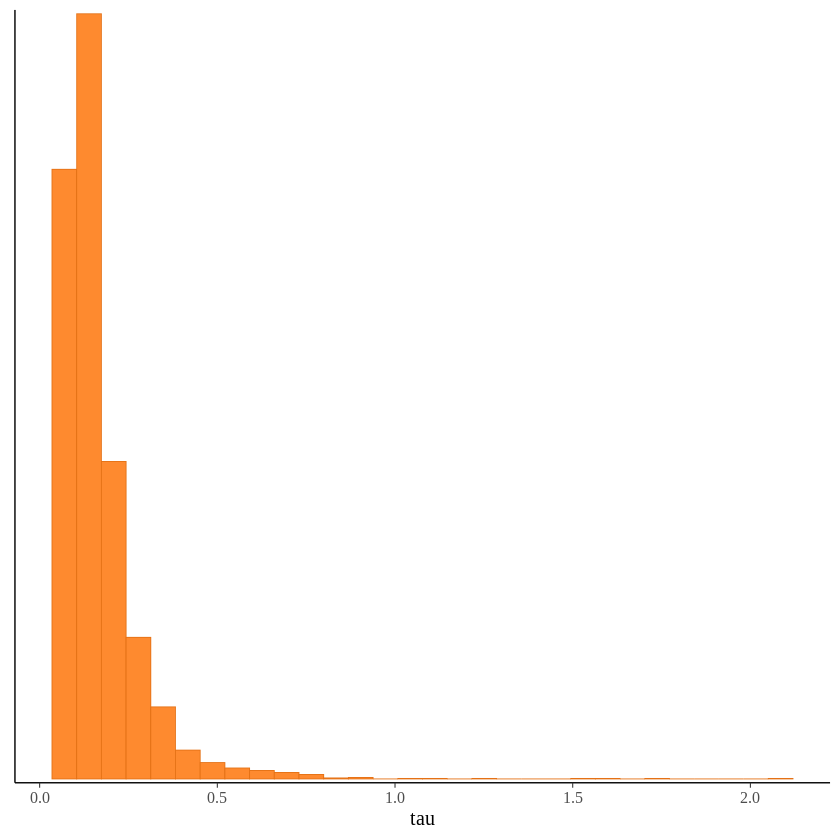

In [58]:
# marginal p(tau | y)
color_scheme_set("orange")
mcmc_hist( posterior_draws , pars = c('tau'))

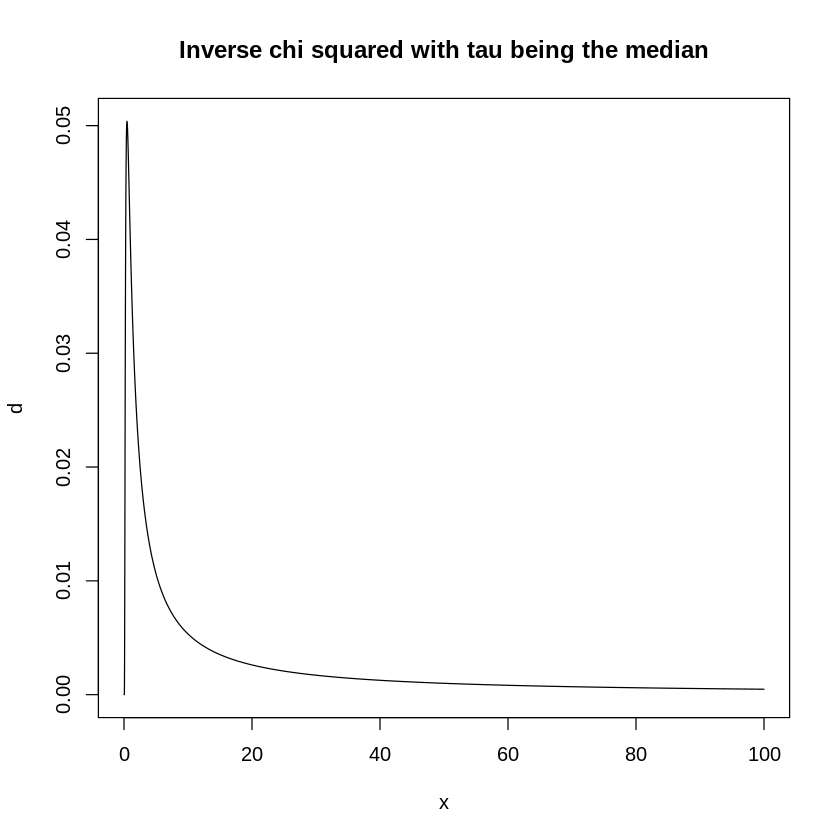

In [59]:
# plot inv_chi2
x = seq(0,100, by=.001)
d = dinvchisq(x, df=tau)
plot(x,d, type="l", main="Inverse chi squared with tau being the median")

In [60]:
print(mu_0)
print(sigma_0)
print(tau)

     mu_0 
-0.151176 
 sigma_0 
0.051817 
[1] 0.132


In [61]:
print(mu_7)
print(sigma_7)

[1] -0.2010184
[1] 0.8394287


In [62]:
## Draw a sample from the sampling distribution
y_7 <- rnorm( 4000, mu_7 , sigma_7 )

## wrapping so that mcmc_hist understands
dim(y_7)   <- c(4000,1)
y_7 <- as.data.frame(y_7)
names(y_7) <- 'y_7'

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



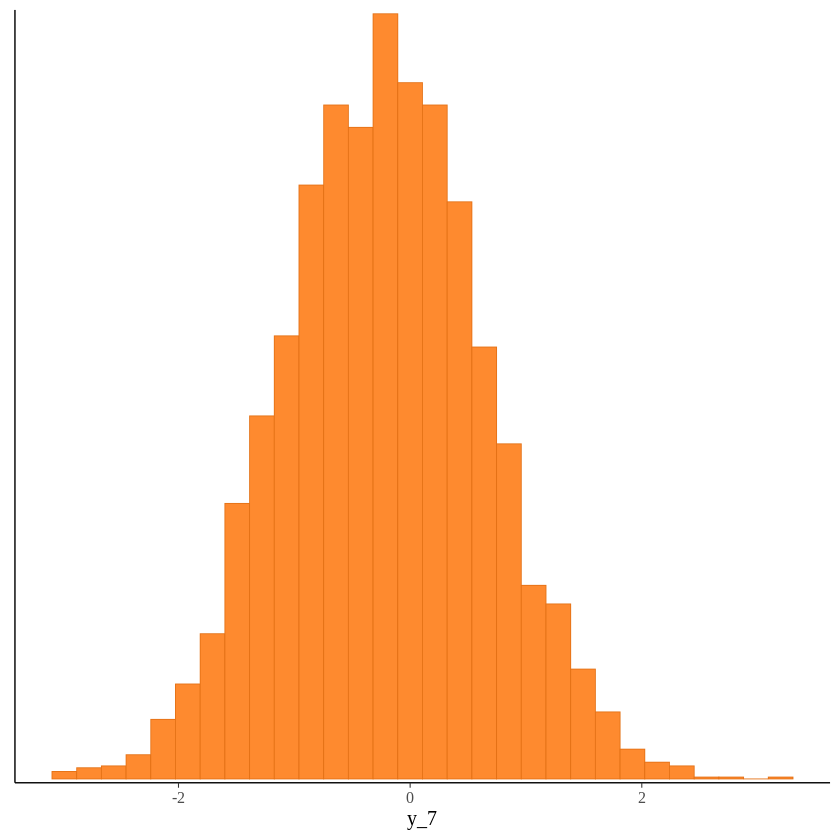

In [63]:
color_scheme_set("orange")
mcmc_hist( y_7 )

### Plotting joint distributions



Let's plot the joint distribution between the different parameters of the model to analyze strong dependencies that can affect the sampler. We can also check the joint distribution between different chains. This somehow indicates convergence to the stationary distribution. If plots show very different joint distribution we can see that different things has been explored and thus mixing is compromised.

Many more things appear here: https://cran.r-project.org/web/packages/bayesplot/vignettes/visual-mcmc-diagnostics.html

In [64]:
np <- nuts_params(fit)

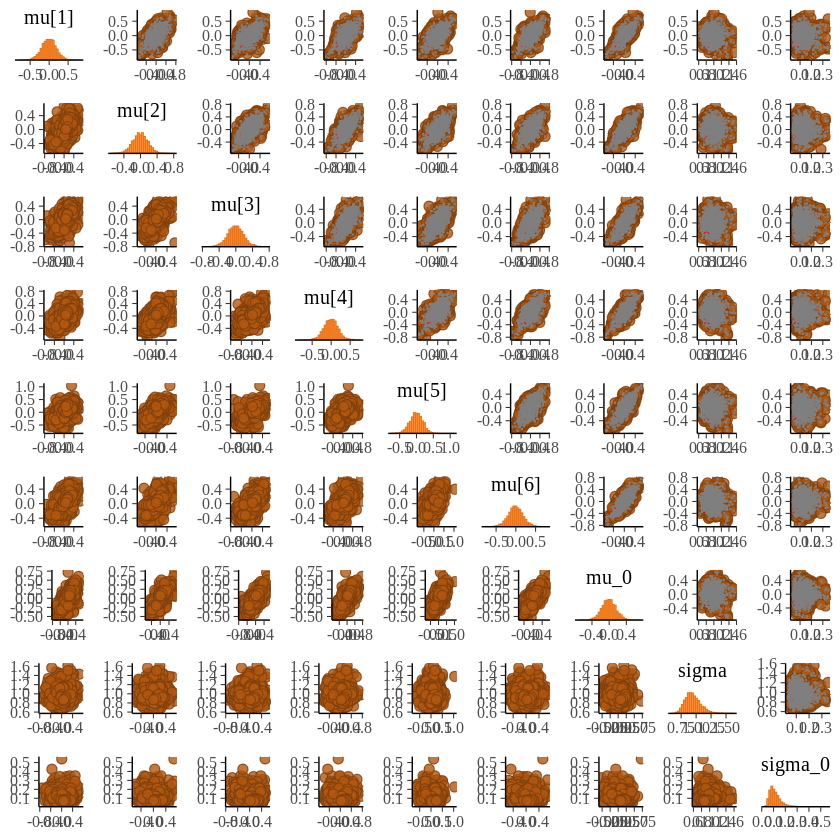

In [65]:
color_scheme_set("orange")
mcmc_pairs(posterior_draws, np = np, regex_pars = c('mu','sigma') )

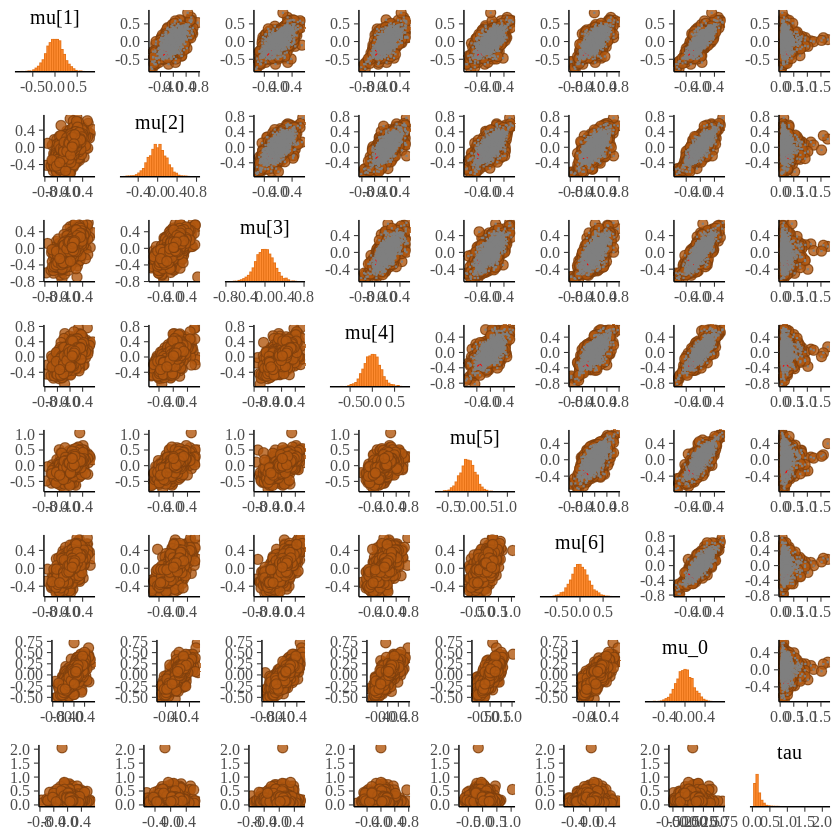

In [66]:
mcmc_pairs(posterior_draws, np = np, regex_pars = c('mu','tau'))

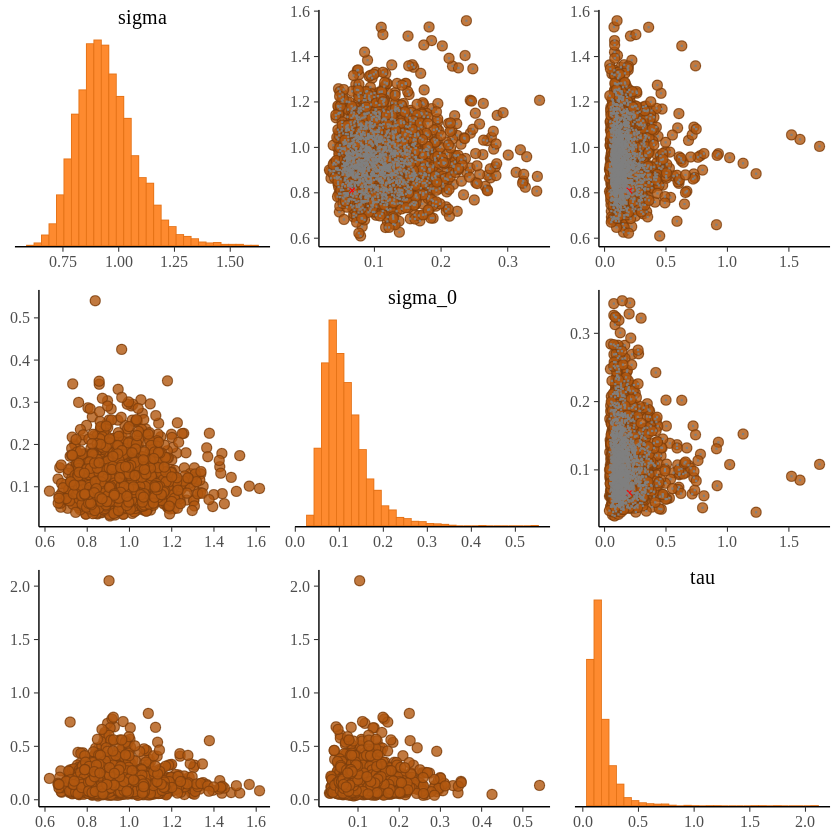

In [67]:
mcmc_pairs(posterior_draws, np = np, regex_pars = c('sigma','tau'))

We can see that there exist some dependency in the parameters, as expected. We don't see the typical funnel shape behaviour but we can check there is a high dependency between sigma's and tau. Something similar happens between tau and mu. For example when tau gets a big value so gets sigma. Also when tau get's bigger it seems to be funnel shape behaviour. 

### Analyzing divergences

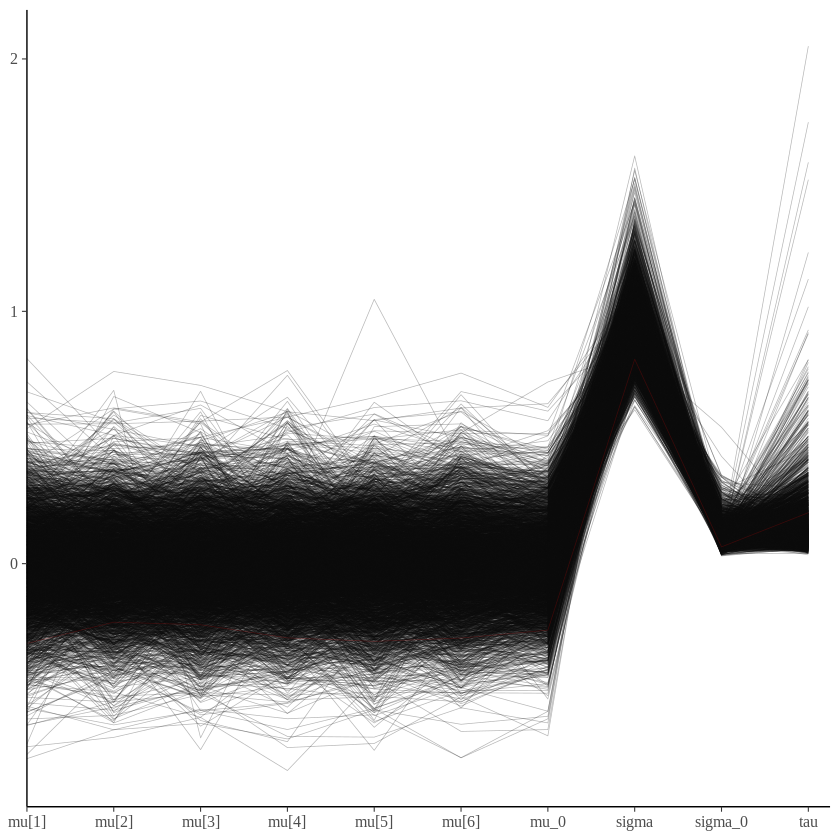

In [68]:
color_scheme_set("darkgray")
mcmc_parcoord(posterior_draws, np = np, regex_pars = c('mu','sigma','tau'))

We can see there are no divergences being highlighted and thus in principle there is no problem with the parameterization.

### Visualizing MCMC chains

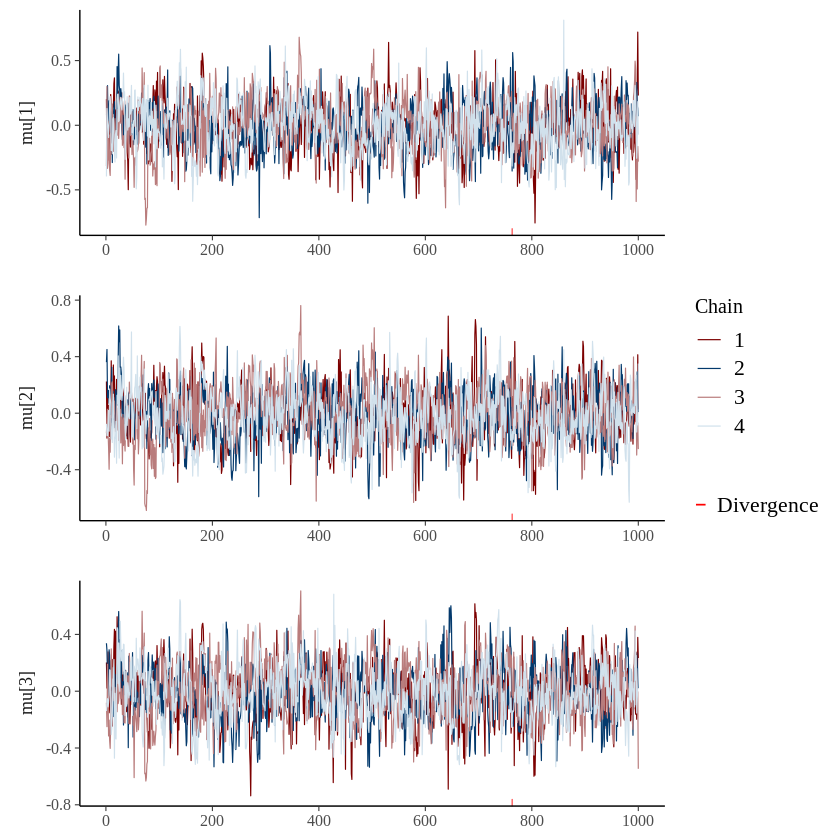

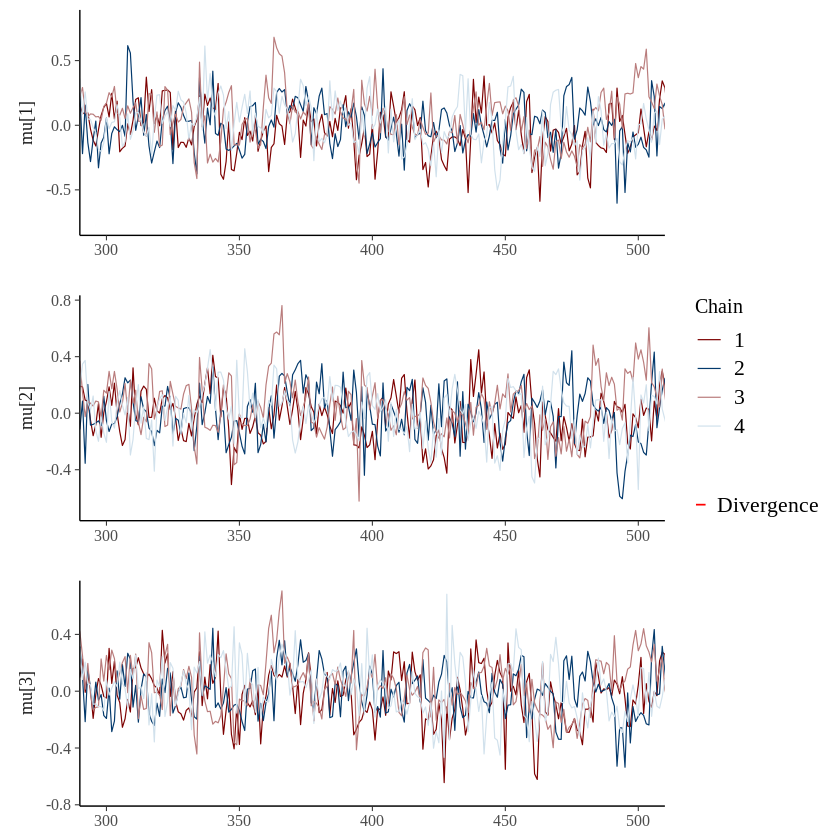

In [69]:
color_scheme_set("mix-blue-red")
mcmc_trace(posterior_draws,  pars = c('mu[1]','mu[2]','mu[3]'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  pars = c('mu[1]','mu[2]','mu[3]'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

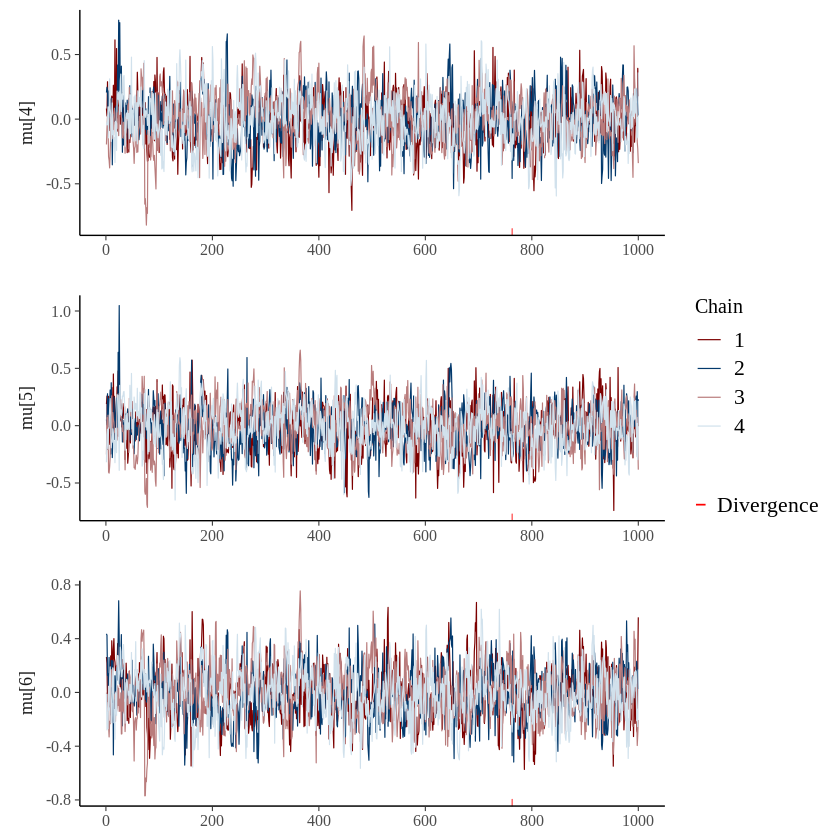

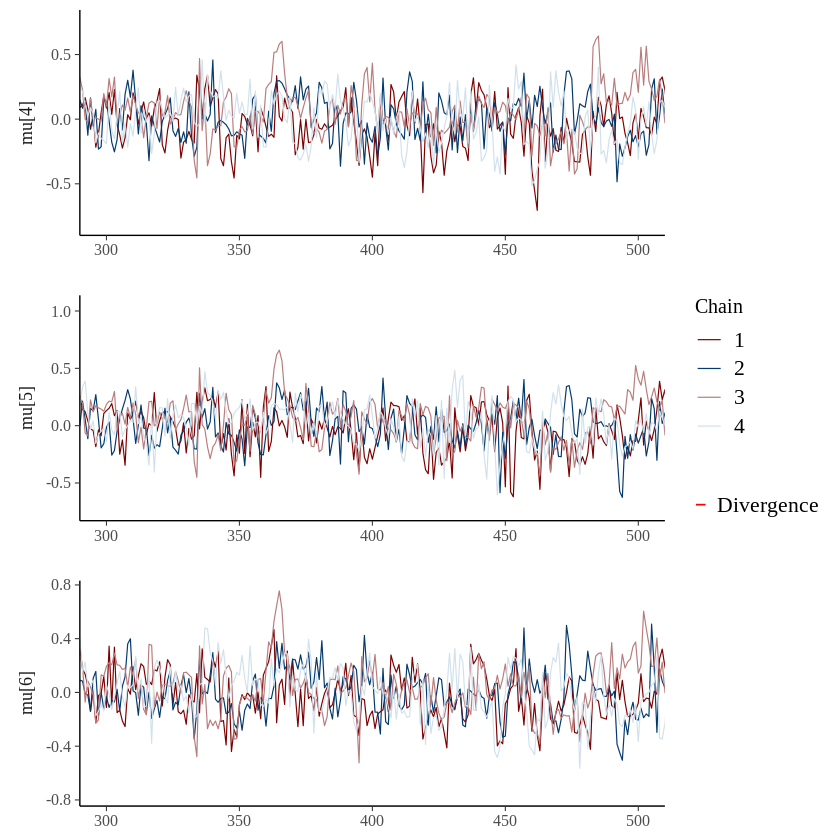

In [70]:
mcmc_trace(posterior_draws,  pars = c('mu[4]','mu[5]','mu[6]'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  pars = c('mu[4]','mu[5]','mu[6]'), np = np, facet_args = list(ncol = 1, strip.position = "left"),  window = c(300,500))

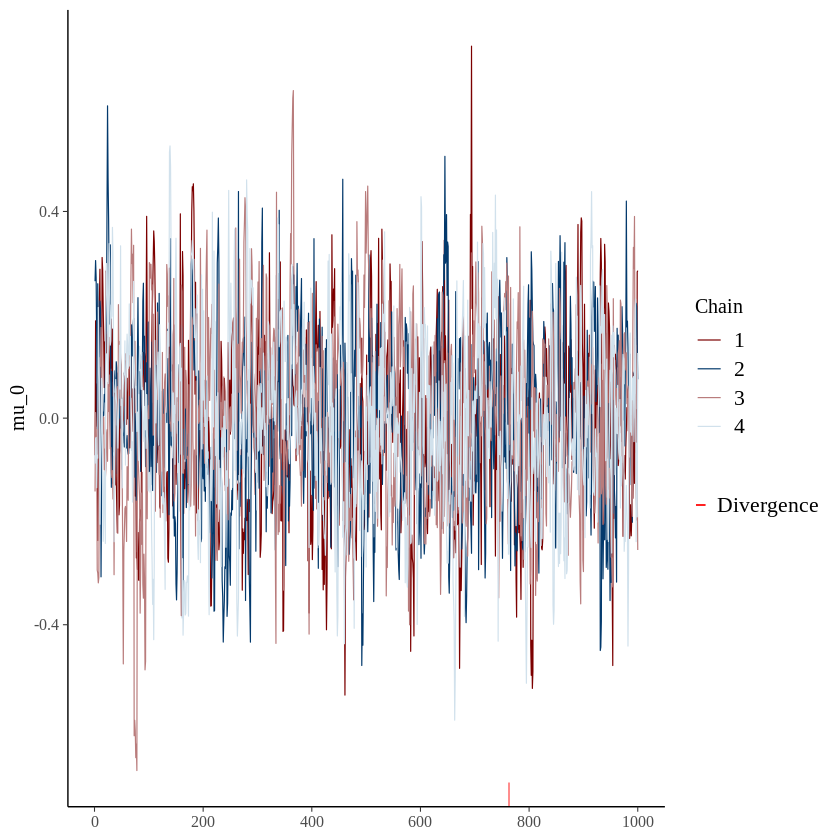

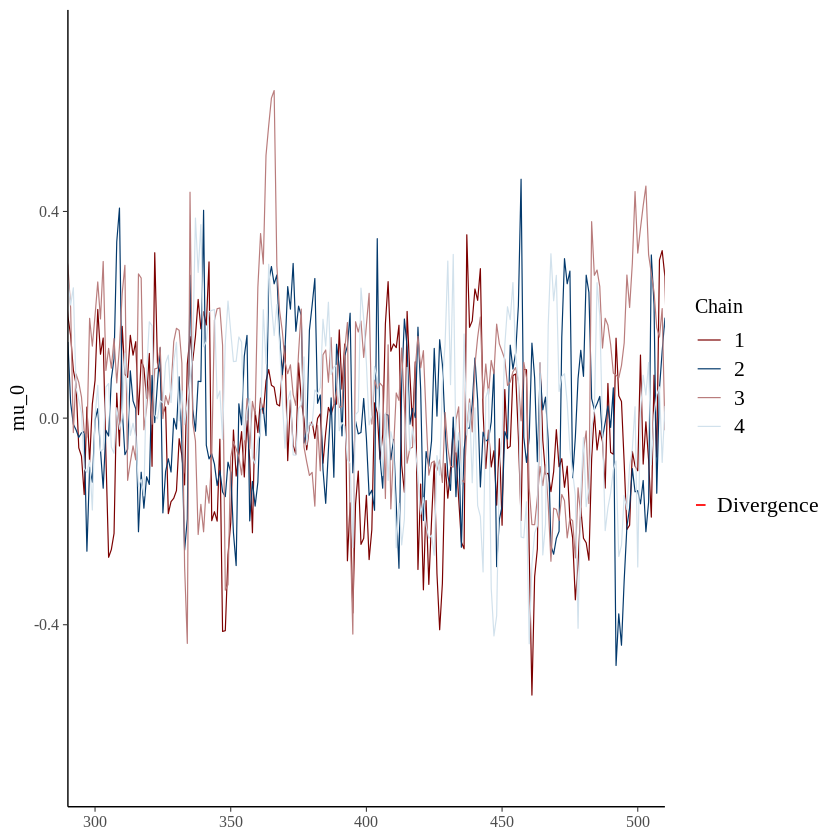

In [71]:
mcmc_trace(posterior_draws,  pars = c('mu_0'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  pars = c('mu_0'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

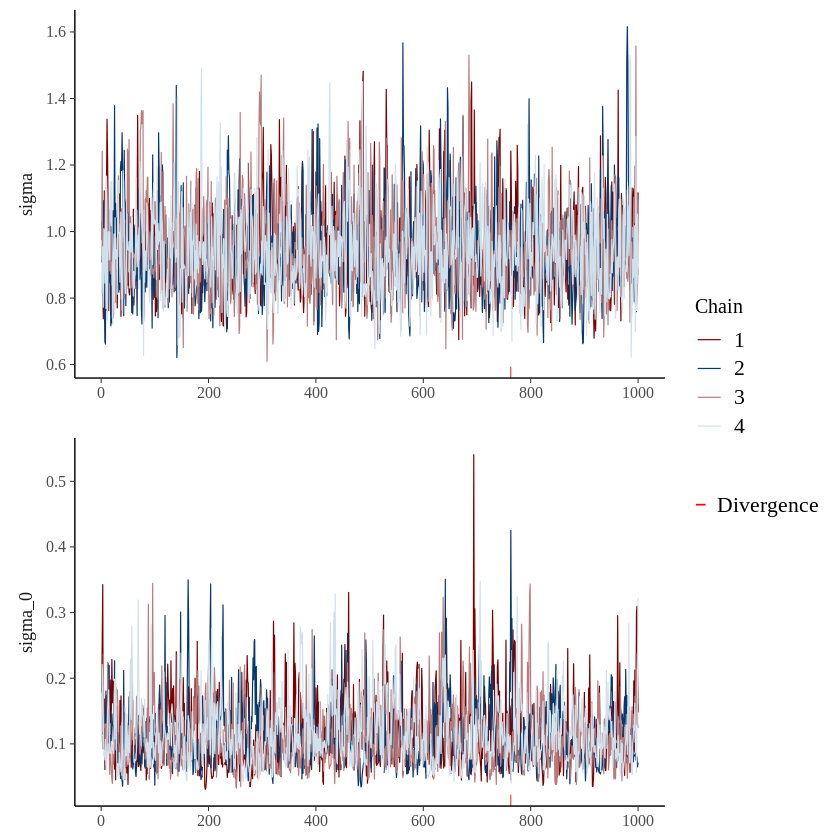

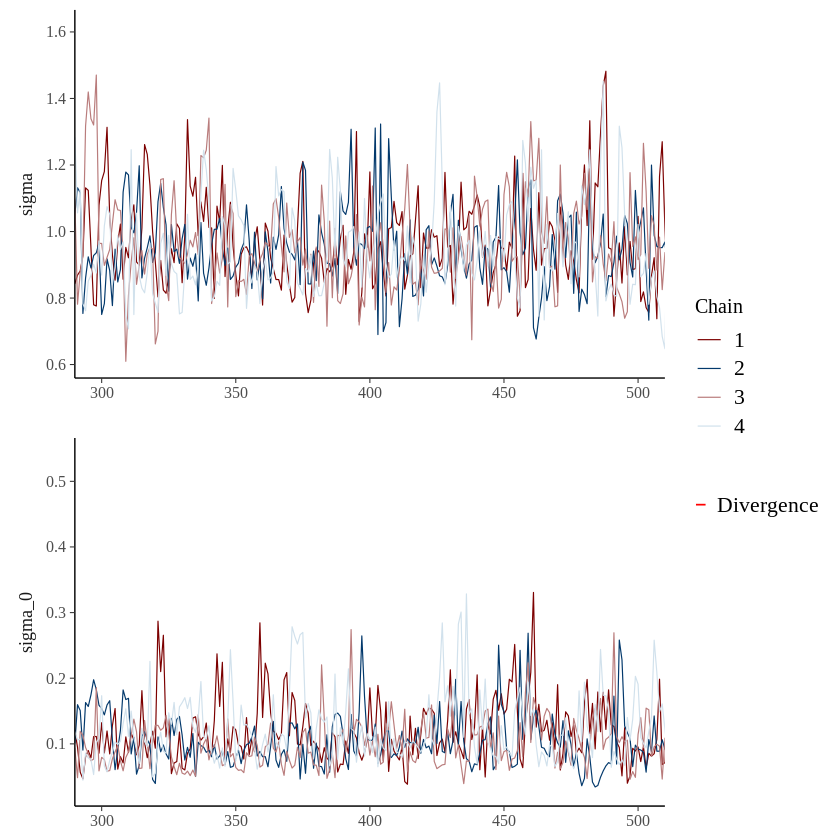

In [72]:
mcmc_trace(posterior_draws,  regex_pars = c('sigma'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  regex_pars = c('sigma'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

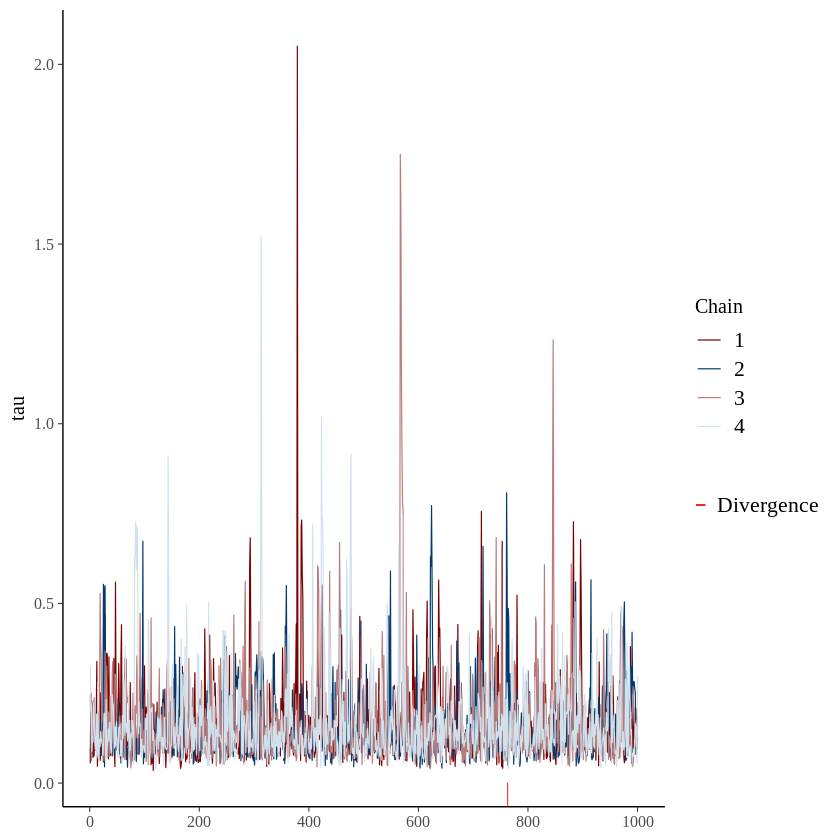

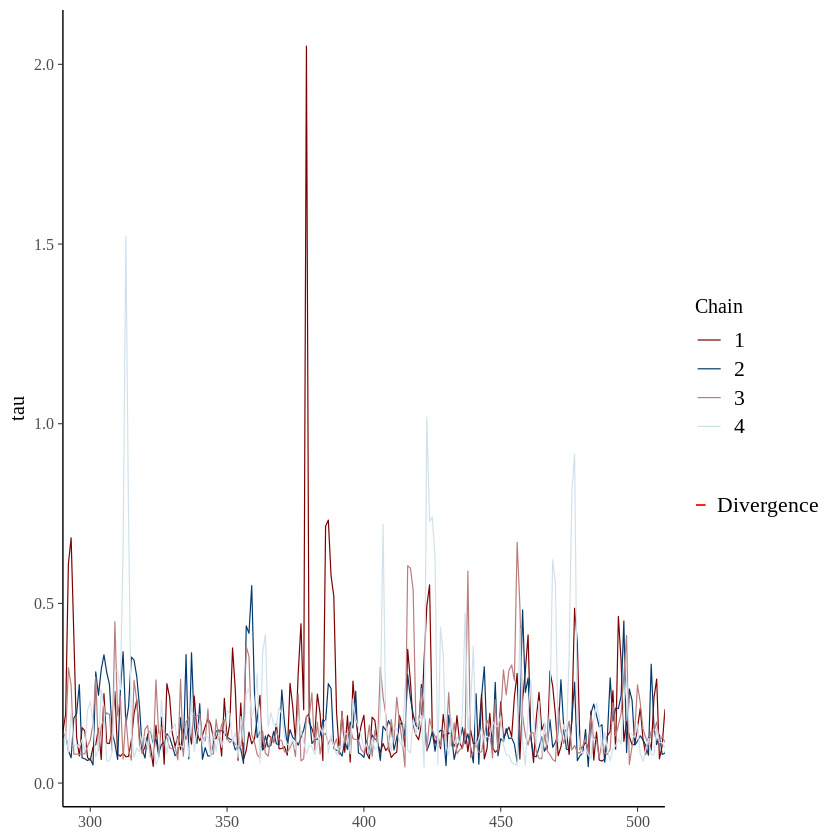

In [73]:
mcmc_trace(posterior_draws,  regex_pars = c('tau'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  regex_pars = c('tau'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

In general we can see that the chains mixed correctly, since they look more or less the same and also we can check there are many jumps, with the chain not being stucked. We can see however a bit of autocorrelation i.e. not so white noise shaped chains. This is because there are dependencies in the parameter posterior, which imply a high curvature in the geometry in this place. This makes the adaptative phase fix a small leapfrog step so that there are not divergent transitions in this place, and so this small step makes exploration inefficient in places where the geometry is good and a bigger step could be used to draw more independent samples. This can be the reason why the effective sample size is too small compared to the pooled/unpooled models. 

Regarding the diagnostic summary we dont see to many divergences which is nice. 

In [74]:
fit$diagnostic_summary()

See https://mc-stan.org/misc/warnings for details.




$num_divergent
[1] 0 0 0 1

$num_max_treedepth
[1] 0 0 0 0

$ebfmi
[1] 0.6301283 0.5838856 0.7336864 0.7120788

In [75]:
# fit$sampler_diagnostics( format = 'df' )

## d)

In [76]:
## Set path to model
file   <- file.path("stan_files", "factory", "hierarchical_d.stan")
model  <- cmdstan_model(file)

model$print()

//  Author: * Juan Maroñas *
//  This file implements the hierarchical model in assignment 7 exercise 2 with a more non-informative hyperprior.

data {

  int<lower=0> N;
  int<lower=0> J;
  matrix[N,J]  y; // cannot be array of vectors otherwise when normalizing cannot use - since is not defined between arrays and scalars.
}

transformed data {
  // normalize the data so that standard prior is correctly specified.
  matrix[N,J] y_std;

  for (j in 1:J){
    y_std[,j]  = (y[,j] - mean(y[,j]))  / sd(y[,j]);
  }
}

parameters {

  // likelihood parameters
  vector[J] mu;
  real<lower=0> sigma;

  // prior parameters
  real mu_0;
  real<lower=0> sigma_0;
  real<lower=0> tau;
}

model {

  // hyperpriors distributions
  sigma_0 ~ gamma(1,1);
  tau     ~ gamma(1,1);
  mu_0    ~ normal(0,10);

  // priors
  sigma ~ inv_chi_square( tau );
  for (j in 1:J){
    mu[j] ~ normal(mu_0, sigma_0);
  }

  // likelihood
  for (j in 1:J)
    y_std[,j] ~ normal(mu[j], sigma);
}

generated quantities {



In [77]:
## MCMC sampling

# Data specified in the data module
data_list <- list(
                    y = factory,
                    N = nrow(factory),
                    J = ncol(factory)
                  )

fit <- model$sample(
                      data            = data_list, 
                      seed            = 123, 
                      chains          = 4, 
                      parallel_chains = 4,
                      refresh         = 500,   # print update every 500 iters
                      step_size       = 0.01,  # With his value we remove some divergences. Still 147.
                      adapt_delta     = 0.95   ## This value is recommended here http://avehtari.github.io/BDA_R_demos/demos_rstan/cmdstanr_demo.html#8_comparison_of_k_groups_with_hierarchical_models
                                               #  when there is a small number of divergent transitions. We remove 100
                                               #  divergences but still too many I guess so need to check geometry.
                    )

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 4 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 3 Itera

See https://mc-stan.org/misc/warnings for details.




In [78]:
fit$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-9.535043763,-9.567010000,4.7974862,4.7681306,-17.5880650,-1.6672700,1.022536,223.2142,465.4882
mu[1],0.003224584,0.005802160,0.2535414,0.2372128,-0.4073509,0.4052396,1.003343,1084.1977,1940.1808
mu[2],0.006036744,0.004410230,0.2617281,0.2425793,-0.4210140,0.4150923,1.005270,1073.9235,1789.6252
mu[3],0.004910328,0.006858650,0.2494135,0.2354739,-0.4056078,0.4072859,1.004422,1041.7932,1536.3075
mu[4],0.003227101,0.005760045,0.2508178,0.2377757,-0.4041946,0.3980341,1.004582,1203.6757,1625.0107
mu[5],0.007869701,0.008644645,0.2543373,0.2381619,-0.4011124,0.4114246,1.003615,1069.0004,1768.3983
mu[6],0.011392616,0.007976335,0.2529630,0.2382758,-0.3779600,0.4145600,1.005337,1077.6429,1364.2263
sigma,0.950910645,0.935859500,0.1309601,0.1218734,0.7702494,1.1831595,1.002542,1539.8962,1437.5291
mu_0,0.006678825,0.007667950,0.2134325,0.2042162,-0.3317724,0.3487684,1.007280,810.9260,1198.6934


The posterior credible interval for the mean of the first machine is $[-0.407, 0.405]$. Compared to the more informative priors we can see that this credible interval is wider than before, as it has been happening with all the models run in this jupyter.

### Plotting joint distributions

In [79]:
np <- nuts_params(fit)

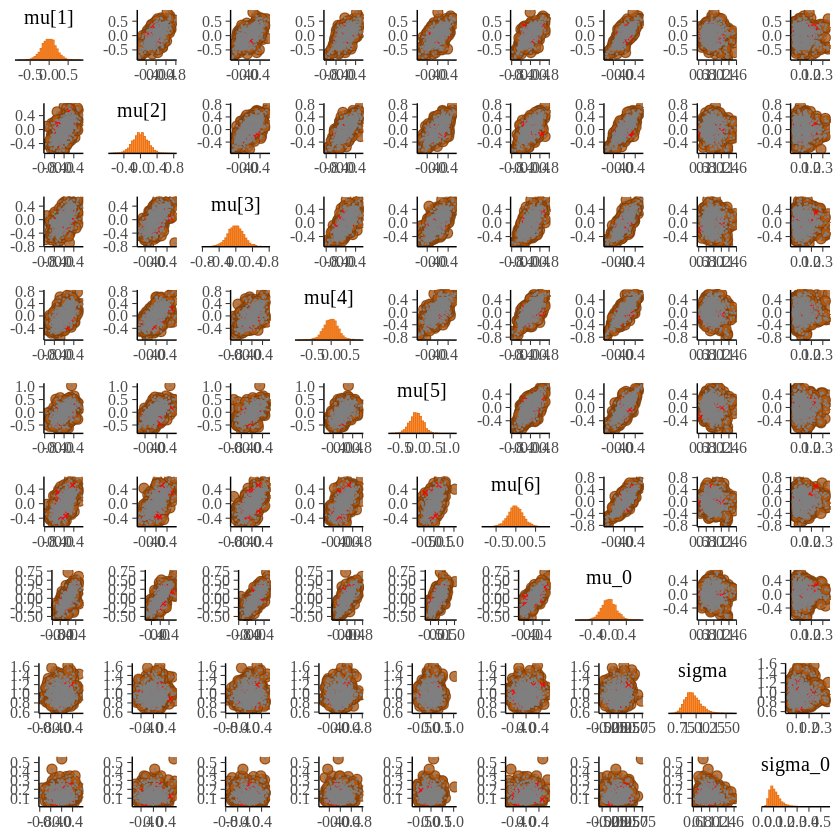

In [80]:
color_scheme_set("orange")
mcmc_pairs(posterior_draws, np = np, regex_pars = c('mu','sigma') )

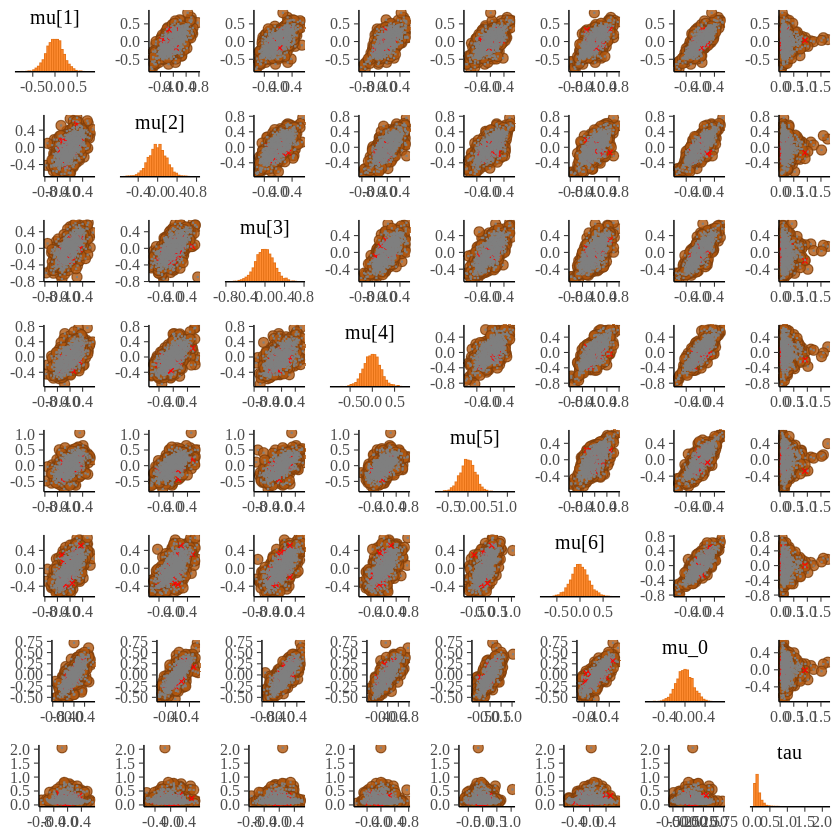

In [81]:
mcmc_pairs(posterior_draws, np = np, regex_pars = c('mu','tau'))

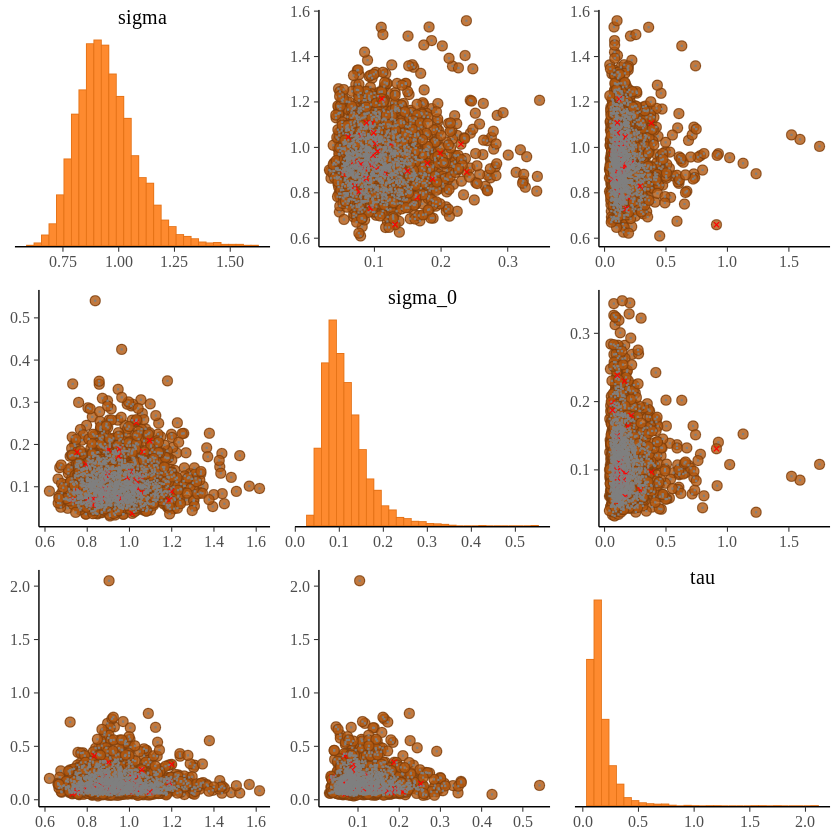

In [82]:
mcmc_pairs(posterior_draws, np = np, regex_pars = c('sigma','tau'))

This time we observe more divergences, that would require further analysis. We don't see a special difference in the dependence in the posterior as compared with the other hierarchical model; so we need further investigation. For example we still see the funnel shape posterior between tau and mu. Having not reached maximum tree depth suggest that the problem is not identifiability. However, clearly there are reagions in the posterior for which the step size is not adequately set.

### Analyzing divergences

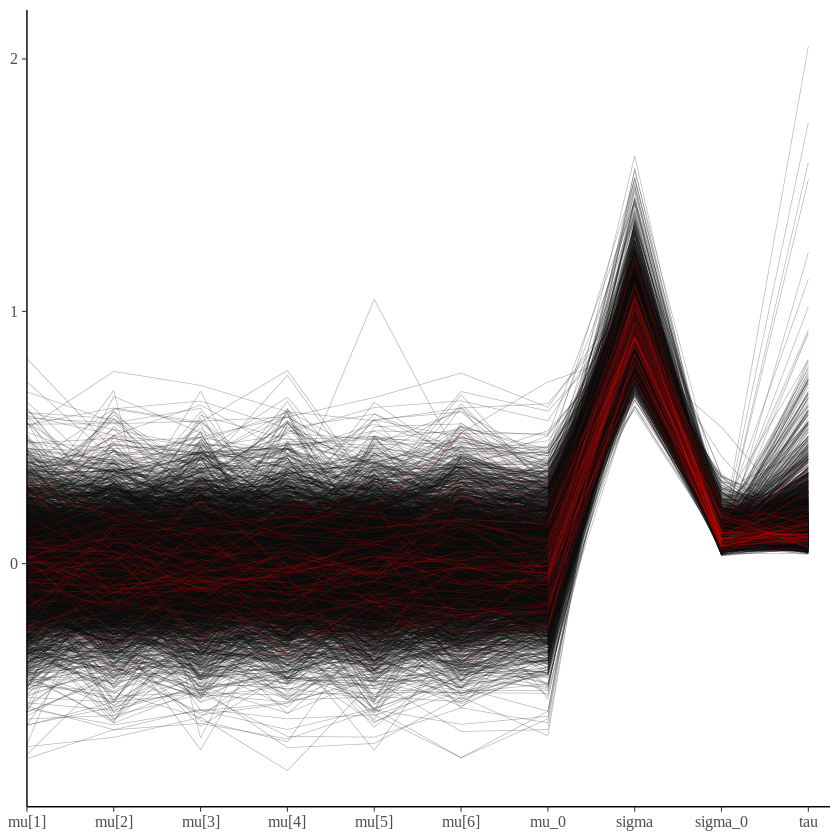

In [83]:
color_scheme_set("darkgray")
mcmc_parcoord(posterior_draws, np = np, regex_pars = c('mu','sigma','tau'))

We can see a common pattern in all the divergences, appearing for values of sigma closed to 1, so we should analyze scatter plots for sigma looking at these regions to see strange behaviours. In principle I don't see anything special in this region of sigma. I would need to look closely to the different scatters. For example looking at the following two, we don't observe anything special around sigma being 1.0. So I'd need to dig a bit more on what is happening here. 

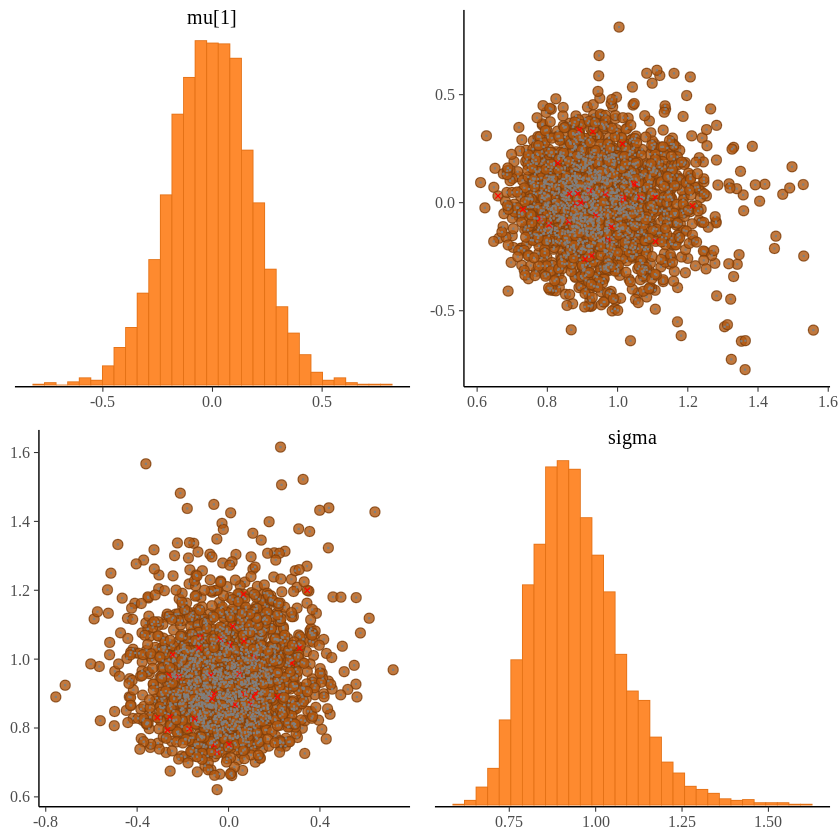

In [84]:
color_scheme_set("orange")
mcmc_pairs(posterior_draws, np = np, pars = c('mu[1]','sigma') )

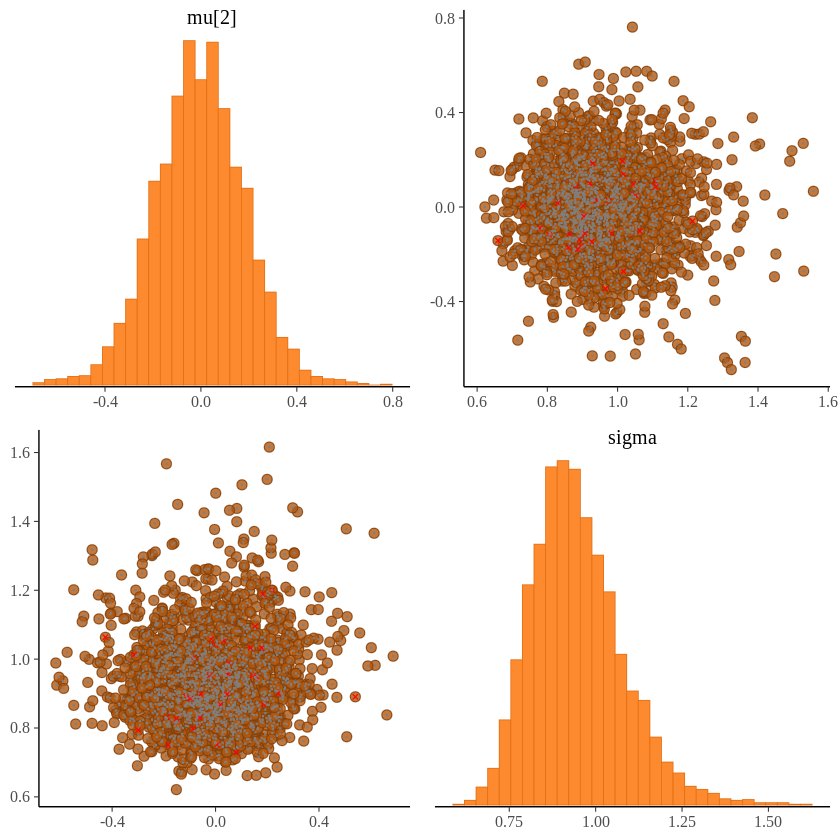

In [85]:
mcmc_pairs(posterior_draws, np = np, pars = c('mu[2]','sigma') )

### Visualizing MCMC chains

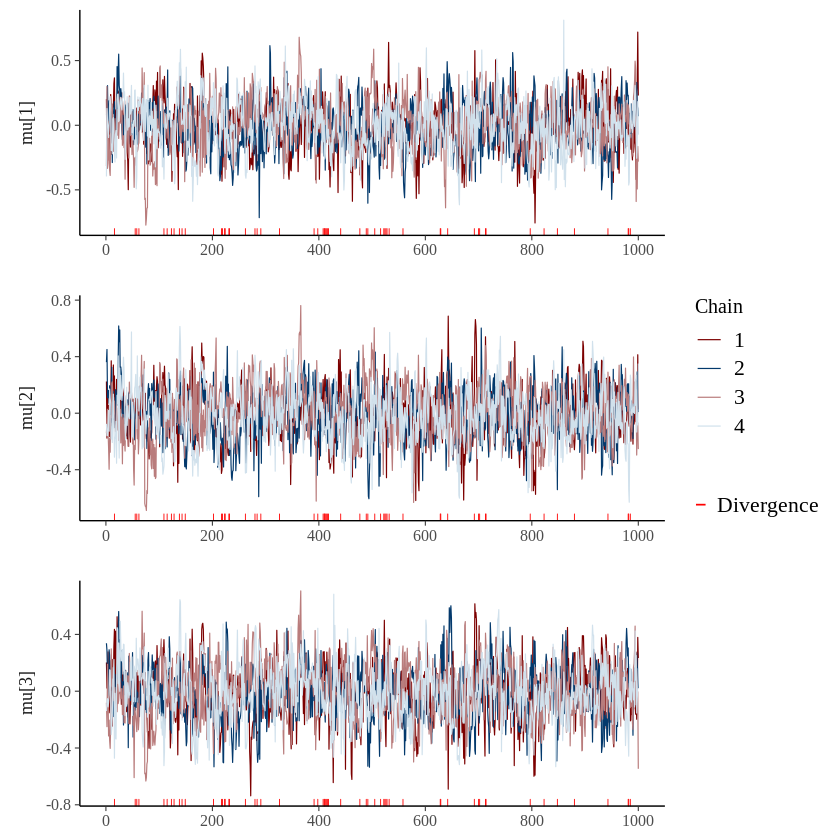

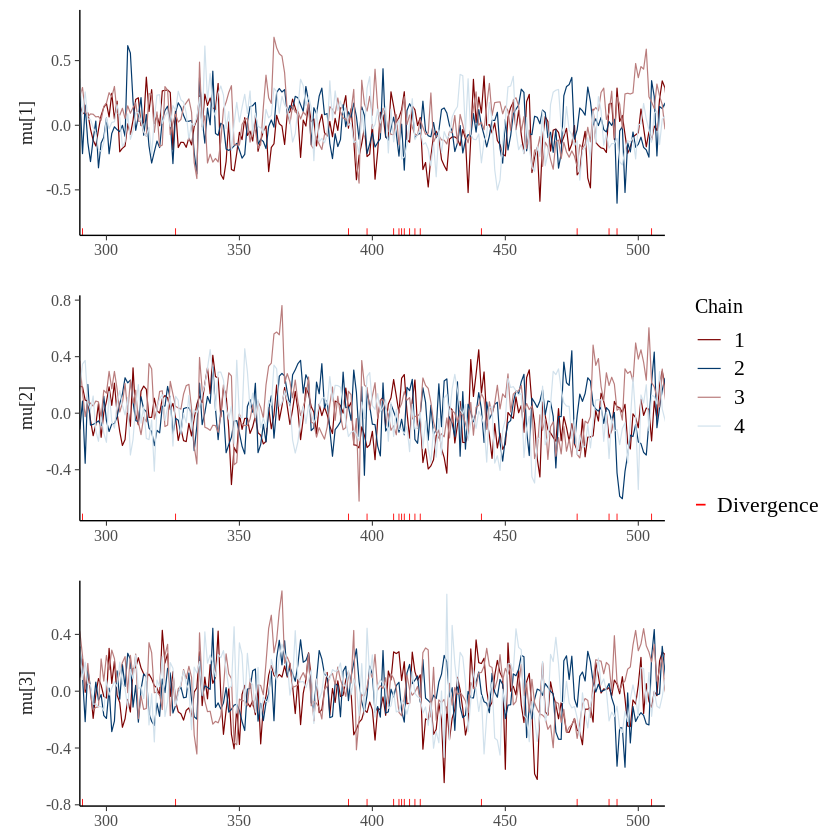

In [86]:
color_scheme_set("mix-blue-red")
mcmc_trace(posterior_draws,  pars = c('mu[1]','mu[2]','mu[3]'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  pars = c('mu[1]','mu[2]','mu[3]'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

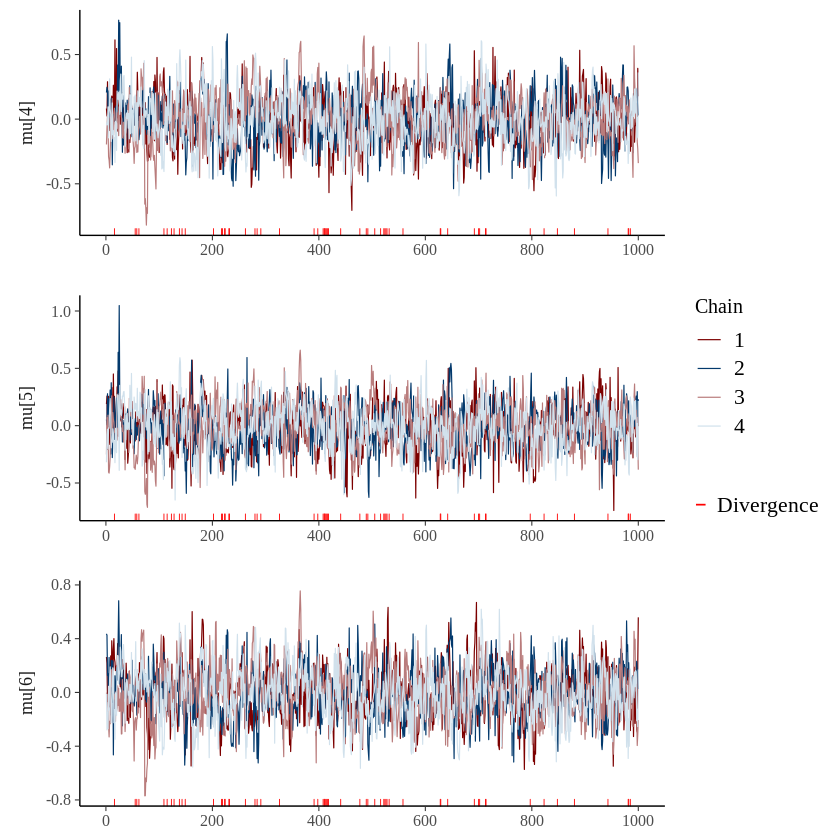

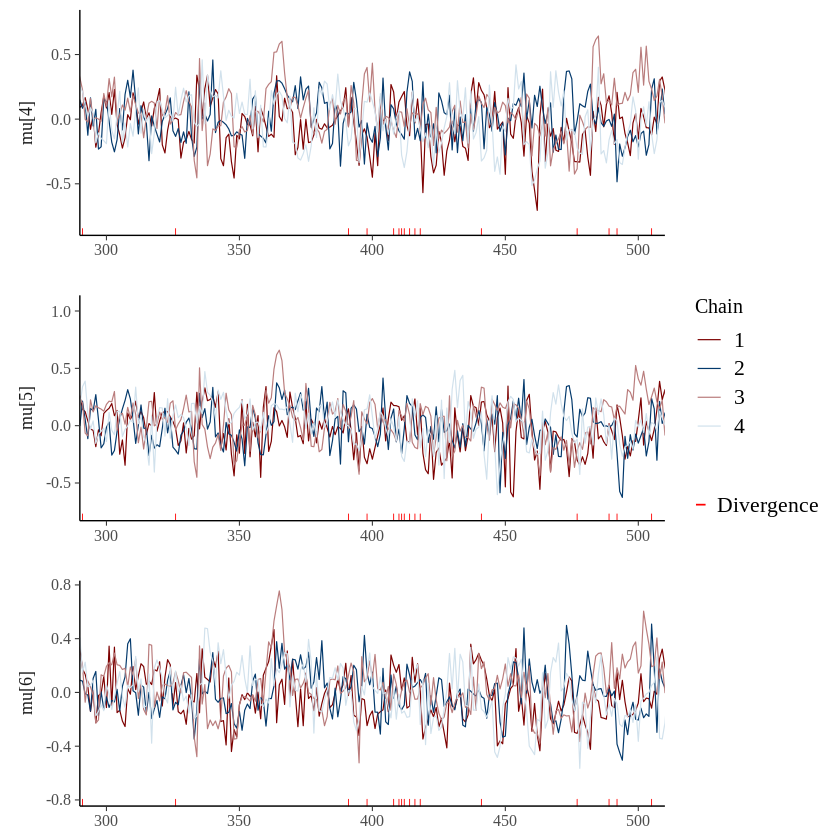

In [87]:
mcmc_trace(posterior_draws,  pars = c('mu[4]','mu[5]','mu[6]'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  pars = c('mu[4]','mu[5]','mu[6]'), np = np, facet_args = list(ncol = 1, strip.position = "left"),  window = c(300,500))

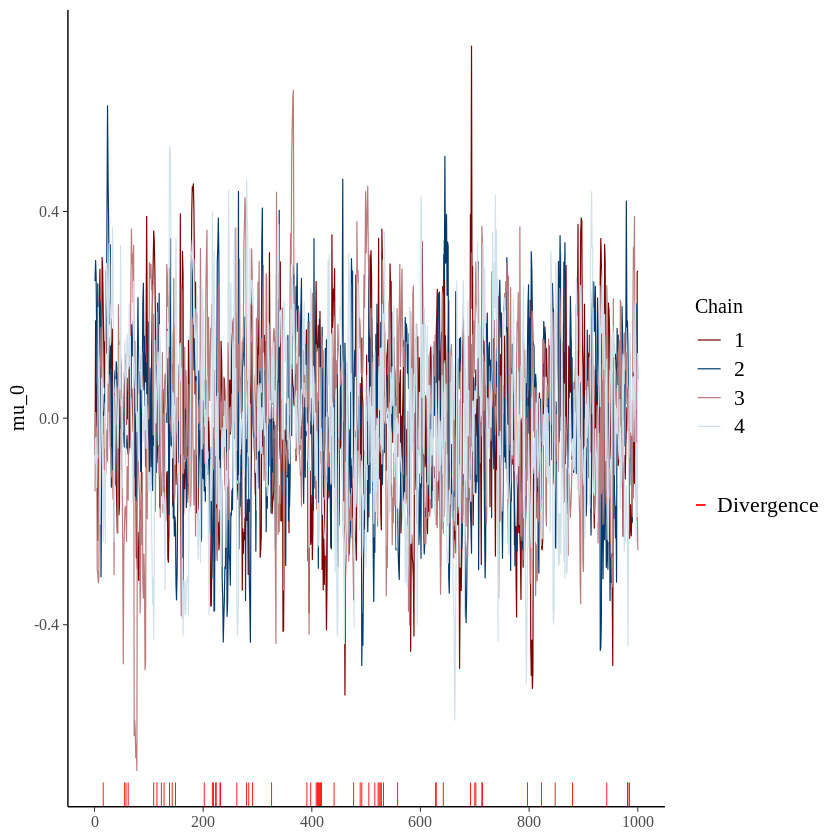

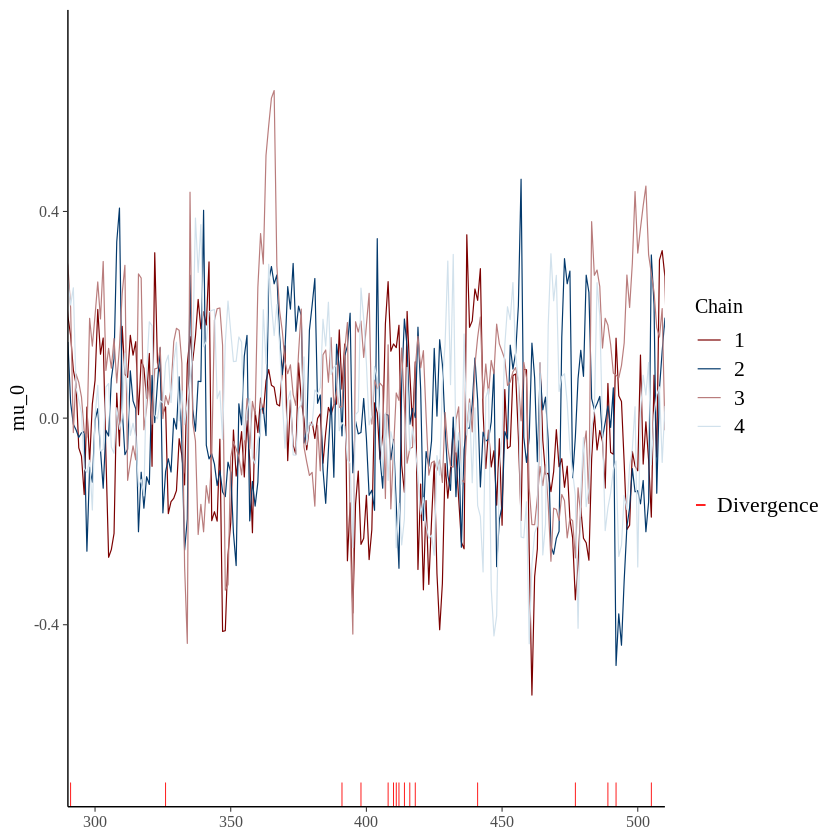

In [88]:
mcmc_trace(posterior_draws,  pars = c('mu_0'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  pars = c('mu_0'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

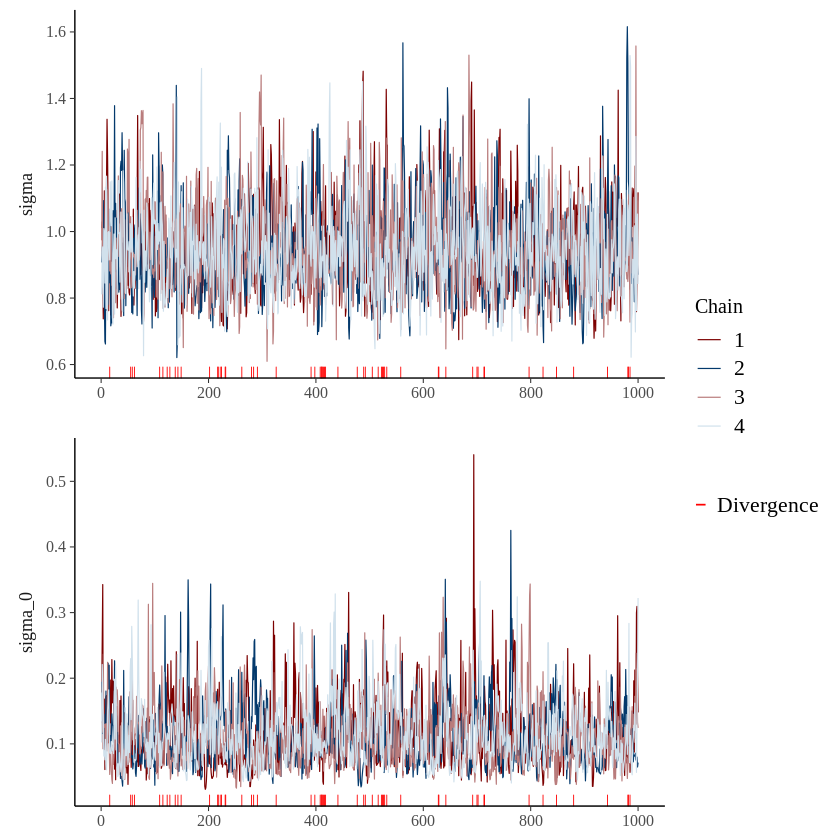

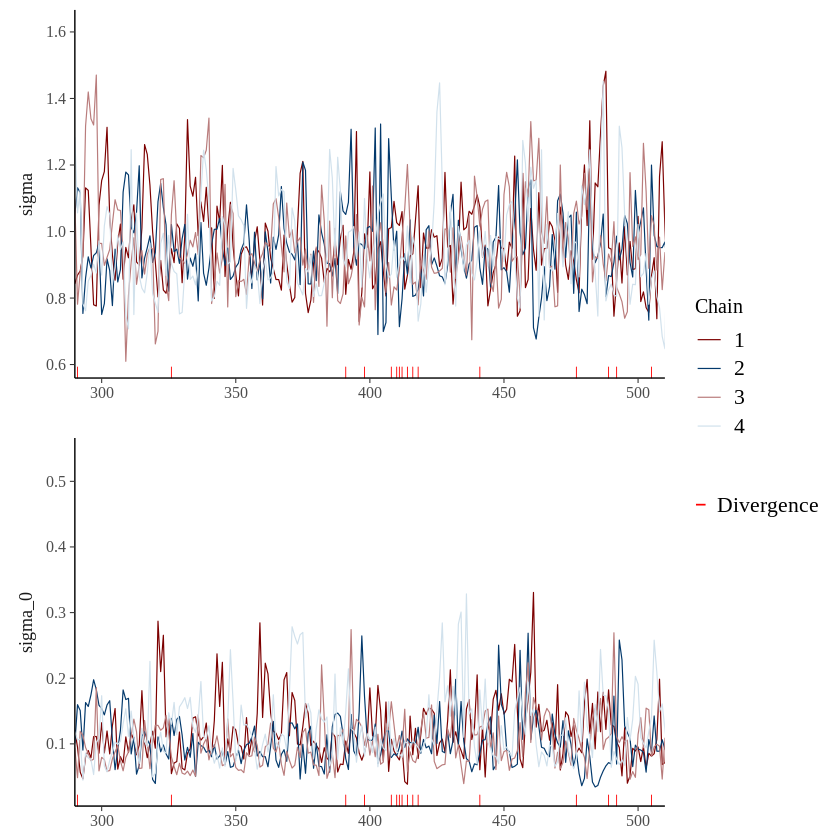

In [89]:
mcmc_trace(posterior_draws,  regex_pars = c('sigma'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  regex_pars = c('sigma'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

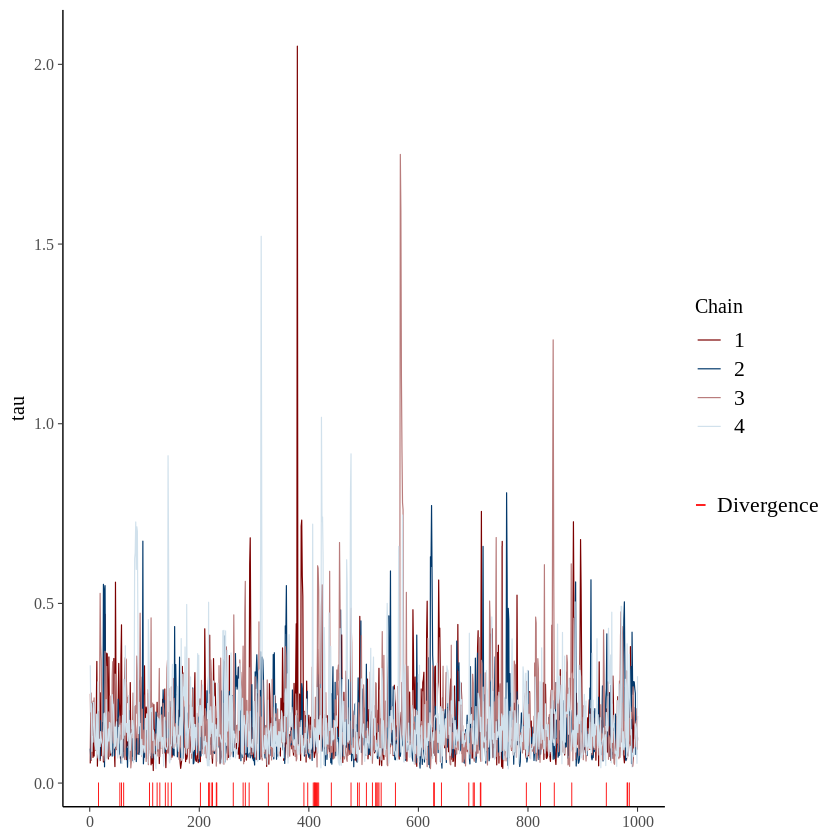

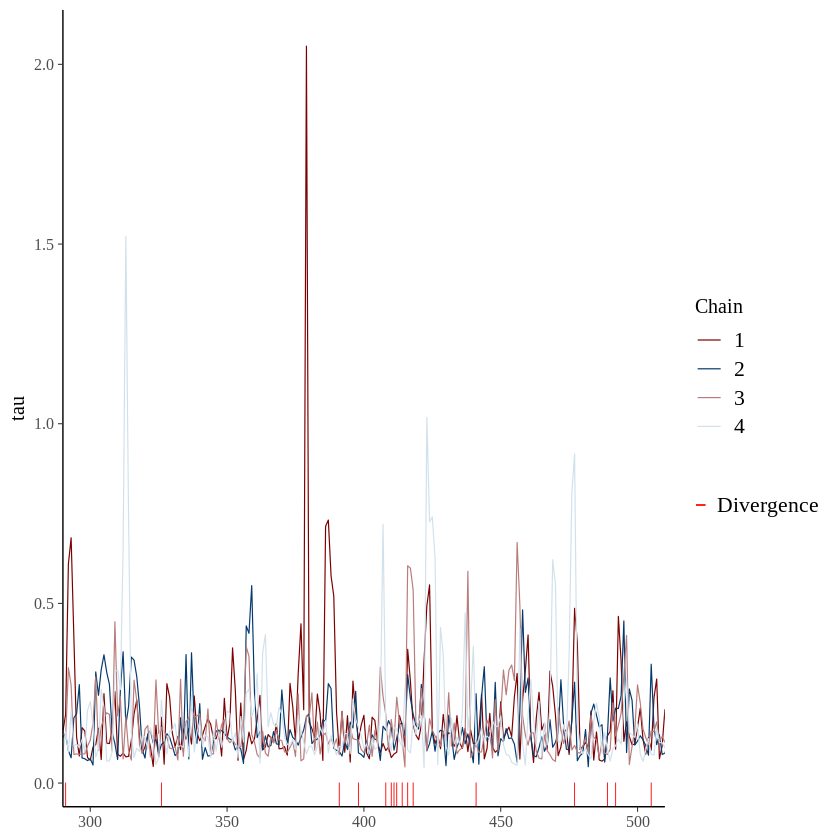

In [90]:
mcmc_trace(posterior_draws,  regex_pars = c('tau'), np = np, facet_args = list(ncol = 1, strip.position = "left"))

mcmc_trace(posterior_draws,  regex_pars = c('tau'), np = np, facet_args = list(ncol = 1, strip.position = "left"), window = c(300,500))

Same reason as for the other model for having low effective sample size. Regarding diagnostics we can see there has been many more divergences than in the other model

In [91]:
fit$diagnostic_summary()

See https://mc-stan.org/misc/warnings for details.




$num_divergent
[1] 17 15  7 22

$num_max_treedepth
[1] 0 0 0 0

$ebfmi
[1] 0.3517283 0.3548746 0.3805467 0.3797349

In [92]:
library(markmyassignment)
assignment_path <-
paste("https://github.com/avehtari/BDA_course_Aalto/,
blob/master/assignments/tests/assignment7.yml", sep="")
set_assignment(assignment_path)
# To check your code/functions, just run
mark_my_assignment()

ERROR: Error in get_file.path_github(path = path, dest = temp_file): Not Found (HTTP 404).
